# Aggregating Multiclass ROC Curves, with Applications to ESG and Credit Risk Management. Rosa Carolina Rosciano, Univerity of Pavia, 2025

# Index:
* Multiclass prediction of Credit ratings
  * Train-test split
  * Base classifier
  * Stratified Nested k-fold Cross Validation with Randomized Search
  * Models: 
    * Decision tree
    * Logistic Regression
    * Random Forest
    * Bagging Classifier
    * XG Boosting
  * Best model explainability

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly
import plotly.express as px
from gini_whitening import *
from proba_whitening import *
from metrics_multi_roc import *
from multi_roc_plotting import *
from robustness import *
from multi_roc_analysis import *


In [2]:
from matplotlib.colors import ListedColormap

custom_colors = sns.color_palette("crest", 3)
jco_cmap = ListedColormap(custom_colors)

sns.set_theme(palette='crest', font='Sans-Serif')
plt.style.use('Solarize_Light2')

In [3]:
data_credit = pd.read_csv('C:/Users/rosic/Desktop/CreditESGproject/data_credit.csv') 
data_credit = data_credit.drop('ESG_class', axis=1)
data_credit = data_credit.drop('ID', axis=1)
data_credit.shape

(1803, 38)

In [4]:
y_credit = data_credit['MORE_score_2022']

In [5]:
print(data_credit.shape)
print(y_credit.shape)

(1803, 38)
(1803,)


In [6]:
# Dropping the target column
X_credit = data_credit.drop('MORE_score_2022', axis=1)

In [7]:
X_credit.shape

(1803, 37)

### Train-test split and data standardization

In [9]:
from sklearn.metrics import (
    confusion_matrix, f1_score, balanced_accuracy_score,
    precision_score, recall_score
)

def p_scores_imbalanced(label, y_true, y_pred):
    """
    Calculate performance metrics for imbalanced multiclass classification.
    
    Parameters:
    -----------
    label_name : str
        Name to identify this evaluation
    y_true : array-like
        True class labels
    y_pred : array-like
        Predicted class labels
        
    Returns:
    --------
    tuple: (overall_metrics, class_metrics)
        Two DataFrames containing overall metrics and per-class metrics
    """
    # Overall metrics (weighted, macro, micro)
    metrics = {
        'Balanced_Accuracy': balanced_accuracy_score(y_true, y_pred),
        'Precision_weighted': precision_score(
            y_true, y_pred,
            average='weighted',
            zero_division=1
        ),
        'Recall_weighted': recall_score(
            y_true, y_pred,
            average='weighted',
            zero_division=1
        ),
        'F1-Score_weighted': f1_score(
            y_true, y_pred,
            average='weighted',
            zero_division=1
        ),
        'Precision_macro': precision_score(
            y_true, y_pred,
            average='macro',
            zero_division=1
        ),
        'Recall_macro': recall_score(
            y_true, y_pred,
            average='macro',
            zero_division=1
        ),
        'F1-Score_macro': f1_score(
            y_true, y_pred,
            average='macro',
            zero_division=1
        ),
        'Precision_micro': precision_score(
            y_true, y_pred,
            average='micro',
            zero_division=1
        ),
        'Recall_micro': recall_score(
            y_true, y_pred,
            average='micro',
            zero_division=1
        ),
        'F1-Score_micro': f1_score(
            y_true, y_pred,
            average='micro',
            zero_division=1
        )
    }
    df_metrics = pd.DataFrame(metrics, index=[label])
    
    # Per‑class metrics
    precision_vals = precision_score(
        y_true, y_pred,
        average=None,
        zero_division=1
    )
    recall_vals = recall_score(
        y_true, y_pred,
        average=None,
        zero_division=1
    )
    f1_vals = f1_score(
        y_true, y_pred, 
        average=None,
        zero_division=1
    )
    
    # Create a structured DataFrame for per-class metrics
    class_metrics_data = []
    for i in range(len(precision_vals)):
        class_metrics_data.append({
            'Class': i,
            'Precision': precision_vals[i],
            'Recall': recall_vals[i],
            'F1-Score': f1_vals[i]
        })
    
    df_class = pd.DataFrame(class_metrics_data)
    
    # Optional: Add class distribution information
    unique, counts = np.unique(y_true, return_counts=True)
    distribution = dict(zip(unique, counts))
    df_class['Samples'] = df_class['Class'].map(lambda x: distribution.get(x, 0))
    df_class['Distribution (%)'] = df_class['Samples'] / len(y_true) * 100

    return df_metrics, df_class

In [10]:
y_credit.value_counts()

MORE_score_2022
4    552
3    391
5    325
2    240
1    121
6     95
7     37
8     23
0     19
Name: count, dtype: int64

In [11]:
from sklearn.model_selection import train_test_split
# Splitting the data
X_train, X_test, y_train, y_test = train_test_split(X_credit, y_credit, test_size=0.2, random_state=19)

X_train.shape, X_test.shape, y_train.shape, y_test.shape

((1442, 37), (361, 37), (1442,), (361,))

In [12]:
y_train.value_counts(), y_test.value_counts()

(MORE_score_2022
 4    436
 3    310
 5    263
 2    202
 1     97
 6     74
 7     31
 8     16
 0     13
 Name: count, dtype: int64,
 MORE_score_2022
 4    116
 3     81
 5     62
 2     38
 1     24
 6     21
 8      7
 0      6
 7      6
 Name: count, dtype: int64)

In [13]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_train_no_dummies = scaler.fit_transform(X_train.iloc[:,0:31])
X_train_no_dummies_df = pd.DataFrame(X_train_no_dummies, index=X_train.index, columns=X_train.columns[0:31])
X_train = pd.concat([X_train_no_dummies_df, X_train.iloc[:,31:]], axis=1)
X_train

,final_normalized_score_env,final_normalized_score_social,final_normalized_score_governance,MORE_score_2021,MORE_score_2020,total_assets_2022,total_assets_2021,total_assets_2020,current_assets_2022,current_assets_2021,...,EBITDA_2020,sectors_Financials,sectors_Health.Util,sectors_Manufacturing,sectors_Tech.Com,regions_Center,regions_Islands,regions_Northeast,regions_Northwest,regions_South
953,-0.615171,1.223465,0.120658,0.204880,0.082682,-0.276210,-0.112022,-0.102528,-0.362482,-0.279996,...,-0.202682,-0.454637,-0.370438,1.212097,False,True,False,False,False,False
1139,0.163650,-1.906014,-0.911346,0.204880,1.422321,-0.283363,-0.114642,-0.104631,-0.366270,-0.281312,...,-0.230259,-0.454637,-0.370438,1.212097,False,False,False,False,True,False
1238,0.163650,0.597569,-0.911346,-1.875665,-0.587137,0.006729,-0.079224,-0.082268,0.045605,-0.091395,...,-0.131944,-0.454637,-0.370438,1.212097,False,False,False,True,False,False
913,-0.615171,0.597569,0.120658,0.898396,0.752502,-0.290548,-0.117884,-0.107503,-0.387363,-0.303033,...,-0.223850,2.199558,-0.370438,-0.825017,False,False,False,False,True,False
1446,0.163650,1.223465,-1.943351,-0.488635,-1.256957,0.006729,0.052947,0.040924,0.045605,0.548865,...,0.947040,-0.454637,-0.370438,1.212097,False,False,True,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
936,0.163650,1.849360,0.120658,-0.488635,-0.587137,17.238082,5.827787,5.263768,11.618038,6.160435,...,16.983985,-0.454637,2.699510,-0.825017,False,False,True,False,False,False
1378,0.163650,-0.654222,-0.911346,-0.488635,-0.587137,-0.224122,-0.096971,-0.093272,-0.214678,-0.173844,...,-0.151341,-0.454637,-0.370438,-0.825017,False,False,False,False,False,True
757,0.163650,-1.280118,0.120658,-0.488635,-1.256957,0.044518,0.002490,-0.007358,0.118723,0.122895,...,0.104042,-0.454637,-0.370438,1.212097,False,False,False,True,False,False
622,-1.393993,-0.013883,0.120658,2.285426,1.422321,0.131772,0.008957,0.032824,0.484996,0.245371,...,-0.389880,2.199558,-0.370438,-0.825017,False,False,False,False,True,False


In [14]:
X_test_no_dummies= scaler.transform(X_test.iloc[:,0:31])
X_test_no_dummies_df = pd.DataFrame(X_test_no_dummies, index=X_test.index, columns=X_test.columns[0:31])
X_test = pd.concat([X_test_no_dummies_df, X_test.iloc[:,31:]], axis=1)
X_test

,final_normalized_score_env,final_normalized_score_social,final_normalized_score_governance,MORE_score_2021,MORE_score_2020,total_assets_2022,total_assets_2021,total_assets_2020,current_assets_2022,current_assets_2021,...,EBITDA_2020,sectors_Financials,sectors_Health.Util,sectors_Manufacturing,sectors_Tech.Com,regions_Center,regions_Islands,regions_Northeast,regions_Northwest,regions_South
1019,0.942471,1.223465,0.120658,1.591911,1.422321,-0.070606,-0.050052,-0.050090,0.173587,0.105287,...,-0.219611,2.199558,-0.370438,-0.825017,False,False,False,True,False,False
884,0.163650,0.597569,0.120658,-1.875665,-1.256957,-0.256665,-0.106452,-0.097932,-0.307550,-0.239989,...,-0.178021,-0.454637,-0.370438,1.212097,False,False,False,False,True,False
1190,0.942471,1.223465,-0.911346,0.898396,0.752502,0.006729,-0.022846,-0.037918,0.045605,0.038780,...,-0.175943,-0.454637,-0.370438,1.212097,False,False,False,False,True,False
891,-2.172814,0.597569,0.120658,-1.875665,-1.256957,-0.286092,-0.116450,-0.105227,-0.380774,-0.301537,...,-0.207335,-0.454637,-0.370438,1.212097,False,False,False,False,False,True
1414,0.163650,-0.654222,-0.911346,0.204880,0.082682,-0.179758,-0.085143,-0.075161,-0.117274,-0.107606,...,-0.169286,-0.454637,-0.370438,-0.825017,False,False,False,True,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1532,0.163650,-1.906014,-1.943351,0.204880,1.422321,-0.074005,-0.035585,-0.022144,0.041490,0.071435,...,-0.134179,-0.454637,-0.370438,1.212097,False,False,False,True,False,False
1601,0.163650,1.223465,-0.088470,0.204880,0.082682,0.112668,0.024466,-0.005280,0.382923,0.355313,...,-0.003231,-0.454637,-0.370438,1.212097,False,False,False,False,True,False
165,0.163650,0.597569,1.152663,0.898396,1.422321,-0.120096,-0.112362,-0.101038,-0.136587,-0.269586,...,-0.223101,-0.454637,-0.370438,-0.825017,False,False,False,False,True,False
660,0.942471,0.091544,0.120658,-0.488635,0.752502,-0.288248,-0.118173,-0.110020,-0.382000,-0.305345,...,-0.019363,-0.454637,-0.370438,1.212097,False,False,True,False,False,False


## Base Classifier

In [15]:
import numpy as np
from sklearn.pipeline import Pipeline
from imblearn.pipeline import Pipeline as ImbPipeline
from sklearn.model_selection import StratifiedKFold, KFold
from sklearn.tree import DecisionTreeClassifier
from sklearn.feature_selection import SequentialFeatureSelector

# Base classifier
dt = DecisionTreeClassifier(
    random_state=19,
    class_weight='balanced',
    splitter='best'
)

cv_sfs = KFold(n_splits=2, shuffle=True, random_state=19)
# Feature selection
sfs = SequentialFeatureSelector(
    dt,
    n_features_to_select='auto',
    direction='forward',
    scoring='f1_weighted',
    cv=cv_sfs,
    n_jobs=-1
)

base_pipe = Pipeline([
    ('feature_selection', sfs),
    ('classifier', dt)
])

labels = ['AAA', 'AA', 'A', 'BBB', 'BB', 'B', 'CCC', 'CC', 'C&D']
base_pipe.fit(X_train, y_train)
y_pred = base_pipe.predict(X_test)
performance, class_performance = p_scores_imbalanced(label=labels, y_true=y_test, y_pred=y_pred)
print(performance)
print(class_performance)

     Balanced_Accuracy  Precision_weighted  Recall_weighted  \
AAA           0.479205            0.535363         0.518006   
AA            0.479205            0.535363         0.518006   
A             0.479205            0.535363         0.518006   
BBB           0.479205            0.535363         0.518006   
BB            0.479205            0.535363         0.518006   
B             0.479205            0.535363         0.518006   
CCC           0.479205            0.535363         0.518006   
CC            0.479205            0.535363         0.518006   
C&D           0.479205            0.535363         0.518006   

     F1-Score_weighted  Precision_macro  Recall_macro  F1-Score_macro  \
AAA           0.520189         0.460965      0.479205        0.456345   
AA            0.520189         0.460965      0.479205        0.456345   
A             0.520189         0.460965      0.479205        0.456345   
BBB           0.520189         0.460965      0.479205        0.456345   
BB  

In [16]:
sfs_pipe = base_pipe.named_steps['feature_selection']
selected_feat = sfs_pipe.get_support()
selected_cols = X_train.columns[selected_feat]
len(selected_cols)

18

In [17]:
def plot_confusion_matrix(cm, ax, report, label):
    sns.heatmap(cm,
                annot=True,
                xticklabels=labels,
                yticklabels=labels,
                ax=ax,
                cmap='crest')
    ax.set_xlabel('Prediction', fontsize=13)
    ax.set_ylabel('Actual', fontsize=13)
    ax.set_title(f'Confusion Matrix with {label}')

    if label == 'clf':
        ax.set_title('Confusion Matrix only with the classifier')
    elif label == 'est':
        ax.set_title('Confusion Matrix with the best estimator')
    else:
        ax.set_title(f'Confusion Matrix with {label}')

    f1 = report['weighted avg']['f1-score']
    precision = report['weighted avg']['precision']
    recall = report['weighted avg']['recall']
    accuracy = (cm.diagonal().sum()) / cm.sum()
    
    # Fix: Access class-specific metrics using string keys instead of integer keys
    class_names = ['AA', 'A', 'BBB', 'BB', 'B', 'CCC']
    f1_scores = []
    
    for i, class_name in enumerate(class_names):
        # Try to get f1-score for each class, with fallback
        try:
            if str(i) in report:
                f1_scores.append(report[str(i)]['f1-score'])
            elif class_name in report:
                f1_scores.append(report[class_name]['f1-score'])
            else:
                f1_scores.append(0.0)
        except (KeyError, TypeError):
            f1_scores.append(0.0)
    
    p0, p1, p2, p3, p4, p5 = f1_scores

    s = f"Precision: {precision:.2f}, Recall: {recall:.2f}, Accuracy: {accuracy:.2f}, F1-Score: {f1:.2f}\nF1-Score for each class:\n0: {p0:.2f}, 1: {p1:.2f}, 2: {p2:.2f}, 3: {p3:.2f}, 4: {p4:.2f}, 5: {p5:.2f}"
    ax.text(0.5, -0.14, s=s,
            horizontalalignment='center', verticalalignment='bottom', transform=ax.transAxes,
            color='#808080', fontfamily='sans-serif', fontsize=12)

Text(277.75, 0.5, 'Actual')

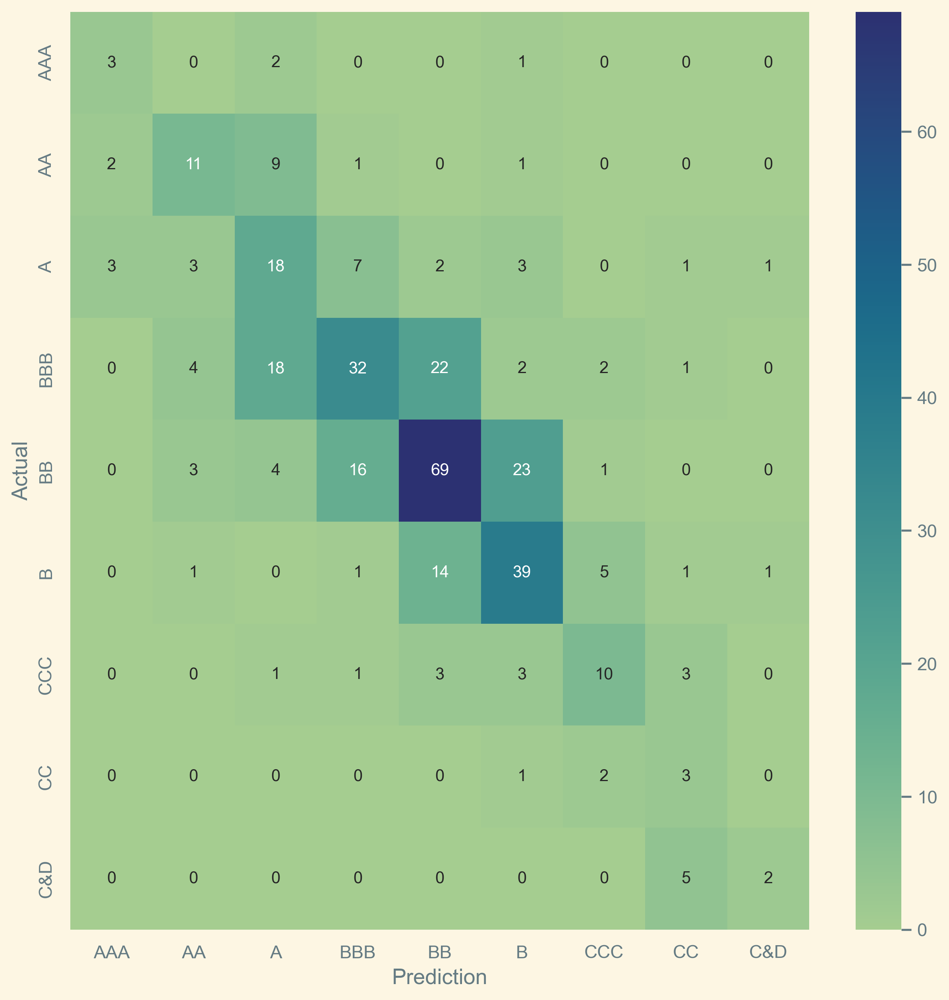

In [18]:
fig, ax = plt.subplots(1,1, figsize=(10,10), dpi=300)

cm = confusion_matrix(y_test, y_pred)

sns.heatmap(cm, annot=True, xticklabels=labels, yticklabels=labels, ax=ax, cmap='crest', annot_kws={"fontsize":10})
ax.set_xlabel('Prediction', fontsize=13)
ax.set_ylabel('Actual', fontsize=13)

## Stratified nested k-fold CV with randomized search

In [19]:
from sklearn.model_selection import GridSearchCV, cross_validate, KFold, RandomizedSearchCV, ShuffleSplit
from numpy import mean
from sklearn.feature_selection import SelectFromModel, SequentialFeatureSelector
import itertools
import numpy as np
from imblearn.pipeline import Pipeline as ImbPipeline  

def nested_cross_validation(dt, clf, X, y, grid_params):

    kfold_dim_red = KFold(n_splits=2, shuffle=True, random_state=19)
    
    dim_reduction_configs = [
        {
            'dim_reduction': [None]
        },
        {
            'dim_reduction': [SelectFromModel(estimator=dt, prefit=True)],
            'dim_reduction__max_features': [None] + list(range(10, 30, 5))
        },
        {
            'dim_reduction': [SequentialFeatureSelector(estimator=dt, n_jobs=-1, n_features_to_select='auto', cv=kfold_dim_red)],
            'dim_reduction__direction': ['forward', 'backward'],
            'dim_reduction__scoring': ['f1_weighted', 'balanced_accuracy']
        }
    ]

    all_configs = []
    for configuration in itertools.product(dim_reduction_configs, grid_params):
        all_parameters = []
        for element in configuration:
            all_parameters.extend(element.items())
        all_configs.append(dict(all_parameters))

    print(f'Number of possible configurations for classifier : {len(all_configs)}')
    print(50 * '-', '\n')

    pipeline = ImbPipeline([
        ('dim_reduction', SequentialFeatureSelector(estimator=dt)),
        ('clf', clf)
    ])

    # Outer and inner loops with KFold instead of Stratified
    outer_cv = KFold(n_splits=2, shuffle=True, random_state=19)
    inner_cv = ShuffleSplit(n_splits=2, test_size=0.2, random_state=19)

    gs = RandomizedSearchCV(
        estimator=pipeline,
        param_distributions=all_configs,
        scoring='f1_weighted',
        n_jobs=-1,
        refit=True,
        cv=inner_cv,
        verbose=3,
        random_state=19
    )

    scores = cross_validate(
        estimator=gs,
        X=X,
        y=y,
        scoring='f1_weighted',
        cv=outer_cv,
        n_jobs=-1,
        verbose=3,
        return_train_score=True,
        return_estimator=True,
        error_score='raise'
    )

    print(50 * '-', '\n')
    print('Inner Loop')
    for i in range(scores['test_score'].shape[0]):
        print('\nBest F1 Score (on inner  test folds) %.2f' % (scores['estimator'][i].best_score_))
        print('Best parameters:', scores['estimator'][i].best_estimator_)
        print('F1 Score (on outer test fold) %.2f' % (scores['test_score'][i]))

    mean_scores = scores['test_score'].mean()
    std_scores = scores['test_score'].std()

    print(50 * '-', '\n')
    print('Outer Score %.2f +/- %.2f' % (mean_scores, std_scores))
    print(50 * '-', '\n')

    best_estimator_index = np.argmax(scores['test_score'])
    best_estimator = scores['estimator'][best_estimator_index]

    parameters = best_estimator.best_params_
    estimator = best_estimator.best_estimator_
    best_test_score = scores['test_score'][best_estimator_index]
    best_train_score = scores['train_score'][best_estimator_index]
    fitting_time = scores['fit_time'][best_estimator_index]

    print("Best Estimator parameters:", parameters)
    print("Best Train score: ", best_train_score)
    print("Best Test Score:", best_test_score)
    print("Fitting Time for Best Estimator:", fitting_time, "seconds")
    print(f"Average performance: {mean_scores:.3f} +/- {std_scores:.3f}")

    results = {
        'train_score': best_train_score,
        'test_score': best_test_score,
        'average_performance': f"{mean_scores:.3f} +/- {std_scores:.3f}",
        'fitting_time': fitting_time
    }

    return results, estimator


In [20]:
from sklearn.metrics import classification_report, confusion_matrix, f1_score, balanced_accuracy_score, precision_score, recall_score, roc_curve, auc
from sklearn.model_selection import learning_curve

def class_report(y_true, y_pred):
  report = pd.DataFrame(classification_report(
      y_true=y_true, y_pred=y_pred,
      labels=[0, 1, 2, 3, 4, 5, 6, 7, 8],
      target_names=['AAA', 'AA', 'A', 'BBB', 'BB', 'B', 'CCC', 'CC', 'C&D'], output_dict=True,
        zero_division=0))
  return report


def performance_scores(label, y_true, y_pred, results):
    """
    Calculate performance metrics for imbalanced multiclass classification.
    
    Parameters:
    -----------
    label : str
        Name to identify this evaluation
    y_true : array-like
        True class labels
    y_pred : array-like
        Predicted class labels
    results : dict
        Additional results to include in the output
        
    Returns:
    --------
    tuple: (overall_metrics, class_metrics)
        Two DataFrames containing overall metrics and per-class metrics
    """
    # Overall weighted metrics
    metrics = {
        'Accuracy': balanced_accuracy_score(y_true, y_pred),
        'Precision': precision_score(
            y_true, y_pred,
            average='weighted',
            zero_division=1
        ),
        'Recall': recall_score(
            y_true, y_pred,
            average='weighted',
            zero_division=1
        ),
        'F1-Score': f1_score(
            y_true, y_pred,
            average='weighted',
            zero_division=1
        )
    }
    results.update(metrics)
    df_metrics = pd.DataFrame(results, index=[label])
    
    # Per‑class metrics
    precision_vals = precision_score(
        y_true, y_pred,
        average=None,
        zero_division=1
    )
    recall_vals = recall_score(
        y_true, y_pred,
        average=None,
        zero_division=1
    )
    f1_vals = f1_score(
        y_true, y_pred,
        average=None,
        zero_division=1
    )
    
    # Create a structured DataFrame for per-class metrics
    class_metrics_data = []
    for i in range(len(precision_vals)):
        class_metrics_data.append({
            'Class': i,
            'Precision': precision_vals[i],
            'Recall': recall_vals[i],
            'F1-Score': f1_vals[i]
        })
    
    df_class = pd.DataFrame(class_metrics_data)
    
    # Optional: Add class distribution information
    unique, counts = np.unique(y_true, return_counts=True)
    distribution = dict(zip(unique, counts))
    df_class['Samples'] = df_class['Class'].map(lambda x: distribution.get(x, 0))
    df_class['Distribution (%)'] = df_class['Samples'] / len(y_true) * 100
    
    # Tag the data with the model name
    df_class['Model'] = label
    
    return df_metrics, df_class



def plot_learning_curve(X, y, clf, cv, ax, label):
  train_sizes= [0.01, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0]

  if label == 'clf':
     ax.set_title('Learning Curve for the classifier')
  elif label=='est':
     ax.set_title('Learning Curve for the best estimator')
  else:
      ax.set_title(f'Learning curve for {label}')

  ax.set_xlabel('Training examples')
  ax.set_ylabel('Score')

  train_sizes, train_scores, test_scores = learning_curve(
      estimator=clf,
      X=X, y=y,
      cv=cv,
      n_jobs=-1,
      train_sizes=train_sizes,
      scoring='f1_weighted',
      shuffle=False
   )

  train_mean = np.mean(train_scores, axis=1)
  train_std = np.std(train_scores, axis=1)
  test_mean = np.mean(test_scores, axis=1)
  test_std = np.std(test_scores, axis=1)

  ax.fill_between(train_sizes, train_mean - train_std, train_mean + train_std, alpha=0.1, color='b')
  ax.fill_between(train_sizes, test_mean - test_std, test_mean + test_std, alpha=0.1, color='g')
  ax.plot(train_sizes, train_mean, 'o-', color='b', label='Training score')
  ax.plot(train_sizes, test_mean, 'o-', color='g', label='Cross Validation score')
  ax.legend()


def plot_ROC_AUC(X_test, y_test, est, clf, ax):
    pred_prob = est.predict_proba(X_test)

    # roc curve for classes
    fpr = {}
    tpr = {}
    thresh ={}
    roc_auc = {}

    n_class = 9

    for i in range(n_class):
        fpr[i], tpr[i], thresh[i] = roc_curve(y_test, pred_prob[:,i], pos_label=i)
        roc_auc[i] = auc(fpr[i], tpr[i])

    # Plot each class's ROC curve 
    ax.plot(fpr[0], tpr[0], linestyle='--', color='orange', label=f'Class AAA vs Rest (AUC = {roc_auc[0]:.2f})')
    ax.plot(fpr[1], tpr[1], linestyle='--', color='green', label=f'Class AA vs Rest (AUC = {roc_auc[1]:.2f})')
    ax.plot(fpr[2], tpr[2], linestyle='--', color='blue', label=f'Class A vs Rest (AUC = {roc_auc[2]:.2f})')
    ax.plot(fpr[3], tpr[3], linestyle='--', color='purple', label=f'Class BBB vs Rest (AUC = {roc_auc[3]:.2f})')
    ax.plot(fpr[4], tpr[4], linestyle='--', color='grey', label=f'Class BB vs Rest (AUC = {roc_auc[4]:.2f})')
    ax.plot(fpr[5], tpr[5], linestyle='--', color='yellow', label=f'Class B vs Rest (AUC = {roc_auc[5]:.2f})')
    ax.plot(fpr[6], tpr[6], linestyle='--', color='pink', label=f'Class CCC vs Rest (AUC = {roc_auc[6]:.2f})')
    ax.plot(fpr[7], tpr[7], linestyle='--', color='aqua', label=f'Class CC vs Rest (AUC = {roc_auc[7]:.2f})')
    ax.plot(fpr[8], tpr[8], linestyle='--', color='lightskyblue', label=f'Class C&D vs Rest (AUC = {roc_auc[8]:.2f})')
    ax.plot([0, 1], [0, 1], linestyle='--', color='black', label='Random (AUC = 0.5)')
    ax.set_title(f'Multiclass ROC curve of classifier {clf}')
    ax.set_xlabel('False Positive Rate')
    ax.set_ylabel('True Positive rate')
    ax.legend(loc='best')


# This function will take the best classifier found in the nested cross validation and test it with a cross validation technique
def performance_metrics(dt, label, clf, X_train, y_train, X_test, y_test, grid_params):
    results, best_estimator = nested_cross_validation(dt, clf, X_train, y_train, grid_params)
    

    # Useful for the learning curve
    skfold = StratifiedKFold(
        n_splits=2,
        shuffle=True,
        random_state=19
    )
    # Splitting our test set
    # X1_train, X1_test, y1_train, y1_test = train_test_split(X_test, y_test, test_size=0.2, random_state=19, stratify=y_test)

    # Fitting only the classifier
    # y_pred_clf = clf.predict(X_test)
    # Fitting the whole pipeline
    y_pred_est = best_estimator.predict(X_test)

    if best_estimator.named_steps['dim_reduction'] is not None:
        selected_feats = best_estimator.named_steps['dim_reduction'].get_support()
        selected_cols = X_train.columns[selected_feats]
        print(f"The selected features are {', '.join(feat for feat in selected_cols)}")
        
    
    table_scores, class_metrics = performance_scores(label, y_test, y_pred_est, results)
    report_est = class_report(y_test, y_pred_est)
    cm_est = confusion_matrix(y_test, y_pred_est)

    #plotting
    fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(35, 35), dpi=300)
    plot_confusion_matrix(cm_est, ax=ax1, report=report_est, label='est')
    plot_learning_curve(X=X_test, y=y_test, clf=best_estimator, cv=skfold, ax=ax2, label='est')
    plot_ROC_AUC(X_test=X_test, y_test=y_test, est=best_estimator, clf=label, ax=ax3)
    ax4.set_visible(False)
    fig.delaxes(ax4)
    fig.tight_layout()

    return best_estimator, table_scores, class_metrics

## Models

### Decision tree

In [ ]:
dt_configs = [{
        'clf__criterion':['gini', 'entropy', 'log_loss'],
        'clf__max_depth': list(range(1, 11, 2)),
        'clf__splitter':['best', 'random'],
        'clf__min_samples_leaf': list(range(1, 11, 3)),
        'clf__min_samples_split':[2, 5, 10, 20, 50, 100]
    }]

In [21]:
dt_best, dt_scores, dt_class_m = performance_metrics(dt, label='Decision Tree', clf=dt, X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test, grid_params=dt_configs)

Number of possible configurations for classifier : 3
-------------------------------------------------- 



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 out of   2 | elapsed:   56.3s finished


-------------------------------------------------- 

Inner Loop

Best F1 Score (on inner  test folds) 0.63
Best parameters: Pipeline(steps=[('dim_reduction',
                 SequentialFeatureSelector(cv=KFold(n_splits=2, random_state=19, shuffle=True),
                                           estimator=DecisionTreeClassifier(class_weight='balanced',
                                                                            random_state=19),
                                           n_jobs=-1,
                                           scoring='balanced_accuracy')),
                ('clf',
                 DecisionTreeClassifier(class_weight='balanced',
                                        criterion='entropy', max_depth=5,
                                        min_samples_leaf=4, min_samples_split=5,
                                        random_state=19, splitter='random'))])
F1 Score (on outer test fold) 0.50

Best F1 Score (on inner  test folds) 0.52
Best parameters: Pipel

c:\Users\rosic\anaconda3\envs\rosita\Lib\site-packages\sklearn\model_selection\_validation.py:528: FitFailedWarning: 
2 fits failed out of a total of 22.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
2 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\rosic\anaconda3\envs\rosita\Lib\site-packages\sklearn\model_selection\_validation.py", line 866, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\rosic\anaconda3\envs\rosita\Lib\site-packages\sklearn\base.py", line 1389, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\rosic\anaconda3\envs\rosita\Lib\site-packages\imblearn\pipeline.py",

In [22]:
dt_best

Pipeline(steps=[('dim_reduction',
                 SequentialFeatureSelector(cv=KFold(n_splits=2, random_state=19, shuffle=True),
                                           estimator=DecisionTreeClassifier(class_weight='balanced',
                                                                            random_state=19),
                                           n_jobs=-1, scoring='f1_weighted')),
                ('clf',
                 DecisionTreeClassifier(class_weight='balanced', max_depth=7,
                                        min_samples_leaf=7,
                                        min_samples_split=100,
                                        random_state=19))])

In [23]:
dt_scores

,train_score,test_score,average_performance,fitting_time,Accuracy,Precision,Recall,F1-Score
Decision Tree,0.553095,0.553084,0.527 +/- 0.026,55.848569,0.483538,0.541102,0.515235,0.514154


In [24]:
dt_class_m

,Class,Precision,Recall,F1-Score,Samples,Distribution (%),Model
0,0,0.185185,0.833333,0.303030,6,1.662050,Decision Tree
1,1,0.000000,0.000000,0.000000,24,6.648199,Decision Tree
2,2,0.468085,0.578947,0.517647,38,10.526316,Decision Tree
3,3,0.597222,0.530864,0.562092,81,22.437673,Decision Tree
4,4,0.724138,0.543103,0.620690,116,32.132964,Decision Tree
5,5,0.559322,0.532258,0.545455,62,17.174515,Decision Tree
6,6,0.363636,0.761905,0.492308,21,5.817175,Decision Tree
7,7,0.000000,0.000000,0.000000,6,1.662050,Decision Tree
8,8,0.250000,0.571429,0.347826,7,1.939058,Decision Tree


In [25]:
# Predicted scores
test_preds_dt = dt_best.predict(X_test)
train_preds_dt = dt_best.predict(X_train)

In [26]:
from safeaipackage import core

rga_results = []
rga_dt = core.rga(y_test, test_preds_dt)
rga_results.append(rga_dt)


Unidimensional Gini for class 0: 0.0237
Unidimensional Gini for class 1: 0.0336
Unidimensional Gini for class 2: 0.0186
Unidimensional Gini for class 3: 0.0292
Unidimensional Gini for class 4: 0.0186
Unidimensional Gini for class 5: 0.0186
Unidimensional Gini for class 6: 0.0224
Unidimensional Gini for class 7: 0.0189
Unidimensional Gini for class 8: 0.0234
Unidimensional Gini for class 0: 0.0238
Unidimensional Gini for class 1: 0.0333
Unidimensional Gini for class 2: 0.0185
Unidimensional Gini for class 3: 0.0301
Unidimensional Gini for class 4: 0.0185
Unidimensional Gini for class 5: 0.0185
Unidimensional Gini for class 6: 0.0222
Unidimensional Gini for class 7: 0.0189
Unidimensional Gini for class 8: 0.0231
Multidimensional Theoretical Gini Test set 0.022135732646247658
Multidimensional Theoretical Gini Train set 0.022206162083519727
Multiclass Theoretical AUC Test set 0.5110678663231238
Multiclass Theoretical AUC Train set 0.5111030810417598
Unidimensional Gini for class 0: 0.0237


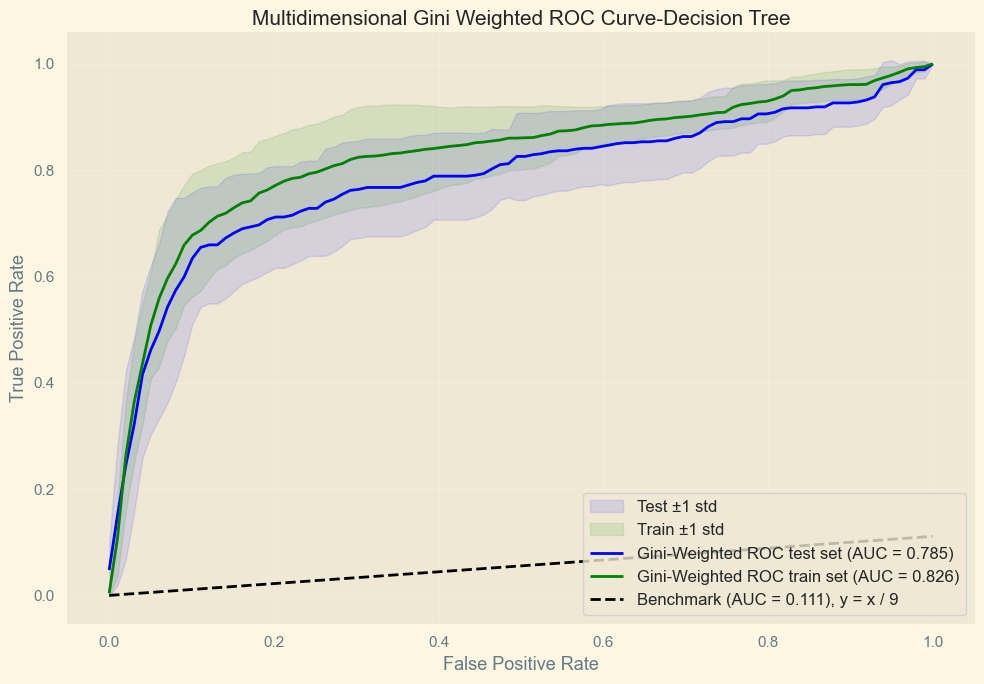


Key Results:
├─ Theoretical Gini (test): 0.0221
├─ Theoretical AUC (test): 0.5111
├─ Empirical AUC (test): 0.7853

Class Weights (Gini-based):
  Class 0: 0.0820
  Class 1: 0.0662
  Class 2: 0.1111
  Class 3: 0.1389
  Class 4: 0.2098
  Class 5: 0.1852
  Class 6: 0.1574
  Class 7: 0.0359
  Class 8: 0.0135

Comparison with Standard Metrics:
├─ Standard Macro AUC: 0.8456
├─ Standard Micro AUC: 0.8720
└─ Gini-weighted AUC: 0.7853

Displaying interactive ROC curve...



Best F1 Score 0.3018 is achieved at threshold 0.4242

ANALYSIS COMPLETE


In [27]:
results = complete_roc_analysis(
    y_train=y_train,
    y_test=y_test,
    X_test=X_test,
    X_train= X_train,
    model=dt_best,
    classifier_name="Decision Tree",
    key_results_display=True
)

In [28]:
plotly.offline.plot(results['figures']['interactive_roc'], filename='C:/Users/rosic/Desktop/CreditESGproject/multiroc_dt.html')
plotly.offline.plot(results['figures']['marginal_roc'], filename='C:/Users/rosic/Desktop/CreditESGproject/multimarginal_dt.html')

'C:/Users/rosic/Desktop/CreditESGproject/multimarginal_dt.html'

In [29]:
whitened_probabilities_dt, _ = whitening_predicted_proba_stable(X_test, X_train, dt_best, y_test, multilabel=False)

In [30]:
gini_weights_test_dt  = results['weights_test']

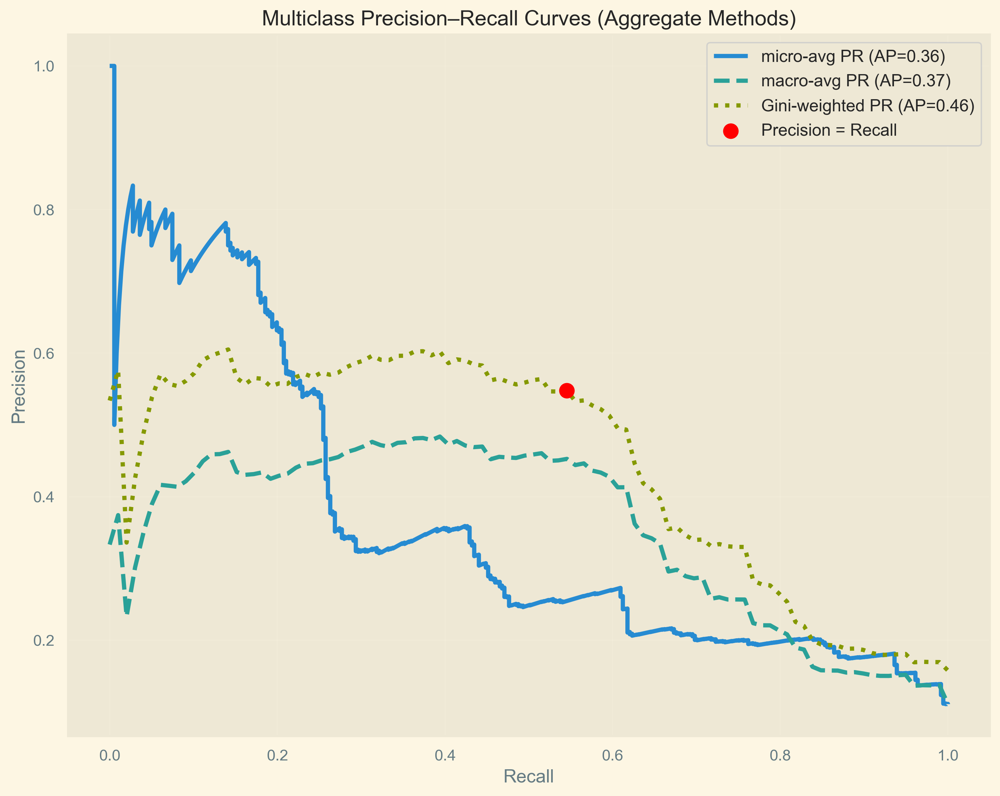

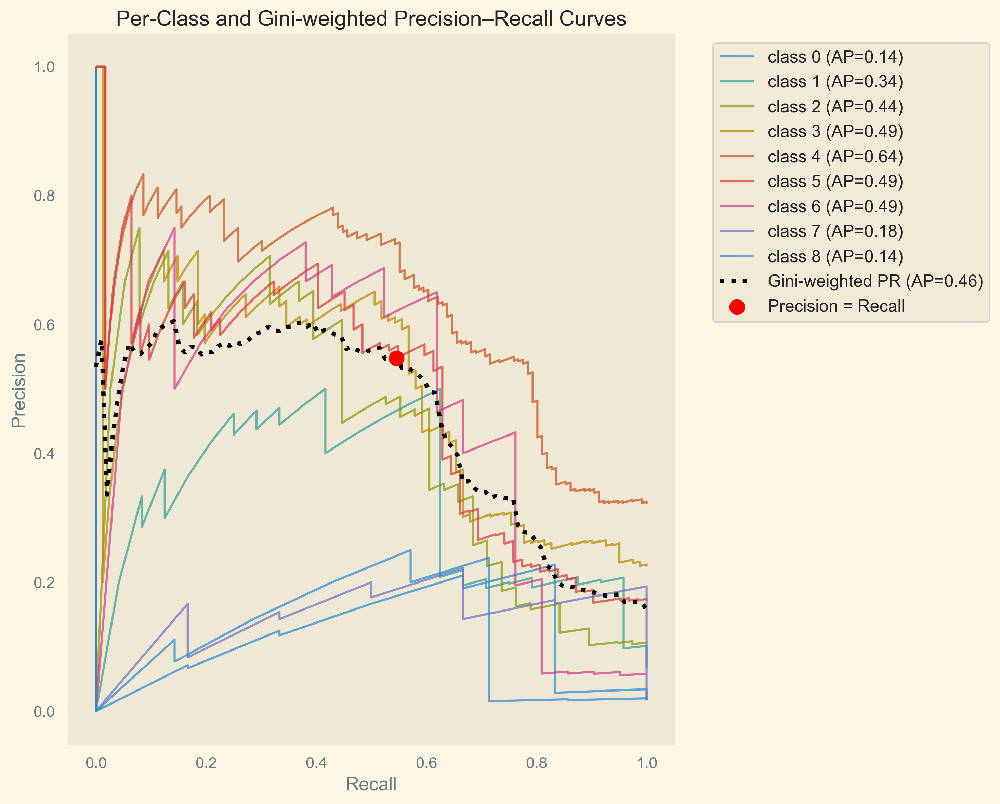

In [31]:
metrics_dict_pr = gini_weighted_pr_curves(y_test, whitened_probabilities_dt, gini_weights_test_dt, n_points=100)

In [32]:
# Max F1 Score at a certain threshold
max_f1 = []
for key, value in metrics_dict_pr.items():
    for metric, score in value.items():
        if metric == 'f1_score':
            max_f1.append((float(key), score))  # Use 'score' instead of 'value'
        
max_f1 = sorted(max_f1, key=lambda x: x[1], reverse=True)

print(f"\nBest F1 Score {max_f1[0][1]:.4f} is achieved at threshold {max_f1[0][0]:.4f}")


Best F1 Score 0.5520 is achieved at threshold 0.5860


In [33]:
perturbation_results, grouped_rgr_values, summary_df = analyze_multiclass_perturbation(X_test, y_test, dt_best, X_test.columns, 
                                   whitened_probabilities_dt, gini_weights_test_dt, perturbation_percentage=0.05)
summary_df

,Variable,Max RGR,Threshold
0,final_normalized_score_env,0.557001,0.597875
1,final_normalized_score_social,0.557001,0.597875
2,final_normalized_score_governance,0.557001,0.597875
3,MORE_score_2021,0.557001,0.597875
4,MORE_score_2020,0.557001,0.597875
5,total_assets_2022,0.557001,0.597875
6,total_assets_2021,0.557001,0.597875
7,total_assets_2020,0.557001,0.597875
8,current_assets_2022,0.557001,0.597875
9,current_assets_2021,0.557001,0.597875


In [34]:
fig_dt = plot_perturbed_roc_comparison(whitened_probabilities_dt, y_test, gini_weights_test_dt, perturbation_results, grouped_rgr_values, summary_df)
fig_dt.show()

In [35]:
plotly.offline.plot(fig_dt, filename='C:/Users/rosic/Desktop/CreditESGproject/perturbation_dt.html')

'C:/Users/rosic/Desktop/CreditESGproject/perturbation_dt.html'

### Logistic regression

In [36]:
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import LogisticRegression
lr = LogisticRegression(
    penalty='l2',           
    C=0.1,                  
    solver='saga',           
    max_iter=1000,          
    tol=1e-4,              
    class_weight='balanced', 
    fit_intercept=True,
    random_state=19         
)

lr_configs=[{
    'clf__C': np.logspace(-4, 4, 20),
    'clf__tol': np.logspace(-8, -3, 6),
    'clf__penalty': ['l1', 'l2', 'elasticnet'],
    'clf__l1_ratio': [0.1, 0.5, 0.9],
    'clf__class_weight': [None, 'balanced'],
    'clf__solver': ['liblinear', 'saga'],
    'clf__intercept_scaling': np.random.uniform(0.5, 2.0, 10),
    'clf__max_iter': [1000, 2000]
}]

In [37]:
lr_best, lr_scores, lr_class_m = performance_metrics(dt, label='Logistic Regression', clf=lr, X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test, grid_params=lr_configs)

Number of possible configurations for classifier : 3
-------------------------------------------------- 



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 out of   2 | elapsed:  1.3min finished


-------------------------------------------------- 

Inner Loop

Best F1 Score (on inner  test folds) 0.58
Best parameters: Pipeline(steps=[('dim_reduction',
                 SequentialFeatureSelector(cv=KFold(n_splits=2, random_state=19, shuffle=True),
                                           direction='backward',
                                           estimator=DecisionTreeClassifier(class_weight='balanced',
                                                                            random_state=19),
                                           n_jobs=-1, scoring='f1_weighted')),
                ('clf',
                 LogisticRegression(C=np.float64(29.763514416313132),
                                    intercept_scaling=np.float64(0.5196400529852228),
                                    l1_ratio=0.9, max_iter=2000,
                                    penalty='elasticnet', random_state=19,
                                    solver='saga', tol=np.float64(1e-05)))])
F1 Score (

c:\Users\rosic\anaconda3\envs\rosita\Lib\site-packages\sklearn\model_selection\_validation.py:528: FitFailedWarning:


2 fits failed out of a total of 22.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
2 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\rosic\anaconda3\envs\rosita\Lib\site-packages\sklearn\model_selection\_validation.py", line 866, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\rosic\anaconda3\envs\rosita\Lib\site-packages\sklearn\base.py", line 1389, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\rosic\anaconda3\envs\rosita\Lib\site-packages\imblearn\pipeline.py"

In [38]:
lr_best

Pipeline(steps=[('dim_reduction',
                 SequentialFeatureSelector(cv=KFold(n_splits=2, random_state=19, shuffle=True),
                                           direction='backward',
                                           estimator=DecisionTreeClassifier(class_weight='balanced',
                                                                            random_state=19),
                                           n_jobs=-1, scoring='f1_weighted')),
                ('clf',
                 LogisticRegression(C=np.float64(29.763514416313132),
                                    intercept_scaling=np.float64(0.5196400529852228),
                                    l1_ratio=0.9, max_iter=2000,
                                    penalty='elasticnet', random_state=19,
                                    solver='saga', tol=np.float64(1e-05)))])

In [39]:
lr_scores

,train_score,test_score,average_performance,fitting_time,Accuracy,Precision,Recall,F1-Score
Logistic Regression,0.603431,0.514259,0.495 +/- 0.019,78.608192,0.354835,0.532308,0.531856,0.514165


In [40]:
result = pd.concat([dt_scores, lr_scores], ignore_index=False)

In [41]:
# Predicted scores
lr_best.fit(X_train, y_train)
test_preds_lr = lr_best.predict(X_test)

c:\Users\rosic\anaconda3\envs\rosita\Lib\site-packages\sklearn\linear_model\_sag.py:348: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



In [42]:
rga_lr = core.rga(y_test, test_preds_lr)
rga_results.append(rga_lr)

In [43]:
proba_test_lr = lr_best.predict_proba(X_test)

Unidimensional Gini for class 0: 0.0186
Unidimensional Gini for class 1: 0.0186
Unidimensional Gini for class 2: 0.0351
Unidimensional Gini for class 3: 0.0421
Unidimensional Gini for class 4: 0.0385
Unidimensional Gini for class 5: 0.0385
Unidimensional Gini for class 6: 0.0186
Unidimensional Gini for class 7: 0.0218
Unidimensional Gini for class 8: 0.0194
Unidimensional Gini for class 0: 0.0188
Unidimensional Gini for class 1: 0.0185
Unidimensional Gini for class 2: 0.0344
Unidimensional Gini for class 3: 0.0415
Unidimensional Gini for class 4: 0.0378
Unidimensional Gini for class 5: 0.0378
Unidimensional Gini for class 6: 0.0185
Unidimensional Gini for class 7: 0.0212
Unidimensional Gini for class 8: 0.0188
Multidimensional Theoretical Gini Test set 0.032552017355146755
Multidimensional Theoretical Gini Train set 0.032021067966949125
Multiclass Theoretical AUC Test set 0.5162760086775734
Multiclass Theoretical AUC Train set 0.5160105339834745
Unidimensional Gini for class 0: 0.0186


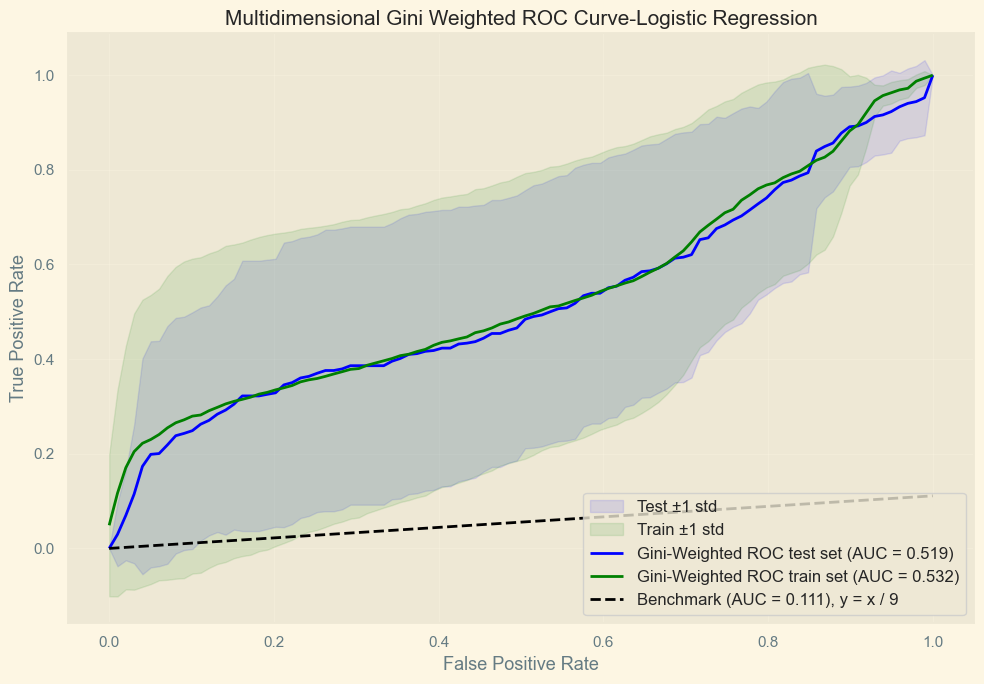


Key Results:
├─ Theoretical Gini (test): 0.0326
├─ Theoretical AUC (test): 0.5163
├─ Empirical AUC (test): 0.5187

Class Weights (Gini-based):
  Class 0: 0.0124
  Class 1: 0.1111
  Class 2: 0.1463
  Class 3: 0.1510
  Class 4: 0.1970
  Class 5: 0.1970
  Class 6: 0.0863
  Class 7: 0.0379
  Class 8: 0.0611

Comparison with Standard Metrics:
├─ Standard Macro AUC: 0.7998
├─ Standard Micro AUC: 0.8776
└─ Gini-weighted AUC: 0.5187

Displaying interactive ROC curve...



Best F1 Score 0.3030 is achieved at threshold 0.5455

ANALYSIS COMPLETE


In [44]:
results_lr = complete_roc_analysis(
    y_train=y_train,
    y_test=y_test,
    X_test=X_test,
    X_train= X_train,
    model=lr_best,
    classifier_name="Logistic Regression",
    key_results_display=True
)

In [45]:
plotly.offline.plot(results_lr['figures']['interactive_roc'], filename='C:/Users/rosic/Desktop/CreditESGproject/multiroc_lr.html')
plotly.offline.plot(results_lr['figures']['marginal_roc'], filename='C:/Users/rosic/Desktop/CreditESGproject/multimarginal_lr.html')

'C:/Users/rosic/Desktop/CreditESGproject/multimarginal_lr.html'

In [46]:
whitened_probabilities_lr, _ = whitening_predicted_proba_stable(X_test, X_train, lr_best, y_test, multilabel=False)

In [47]:
gini_weights_test_lr  = results_lr['weights_test']

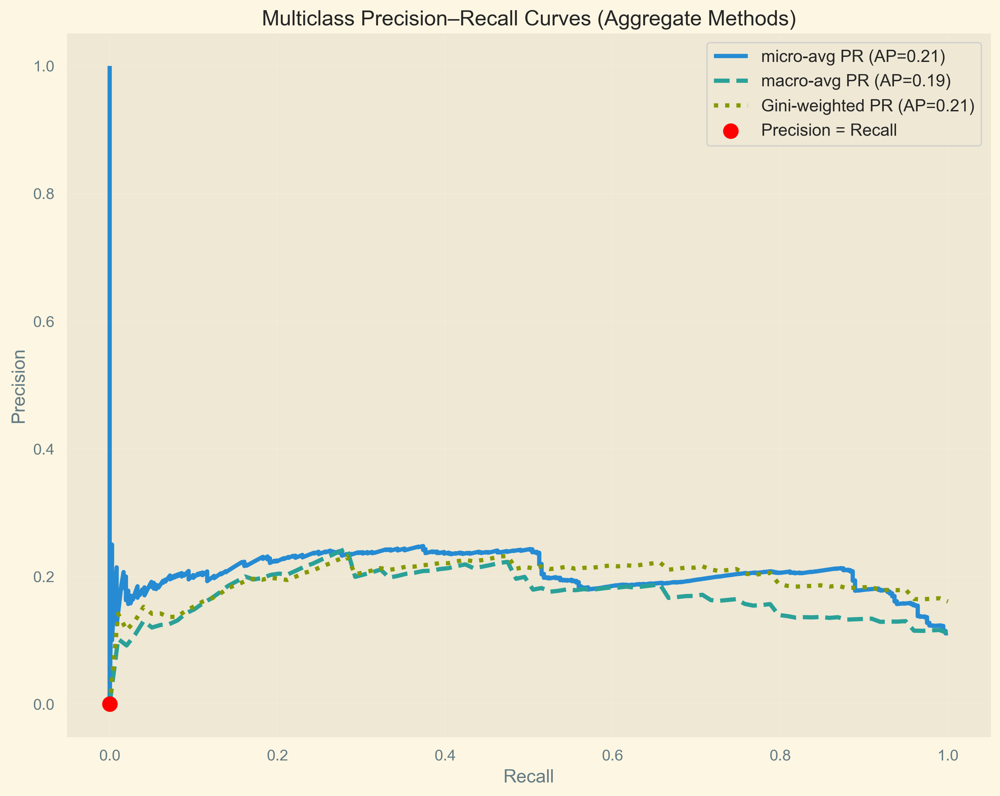

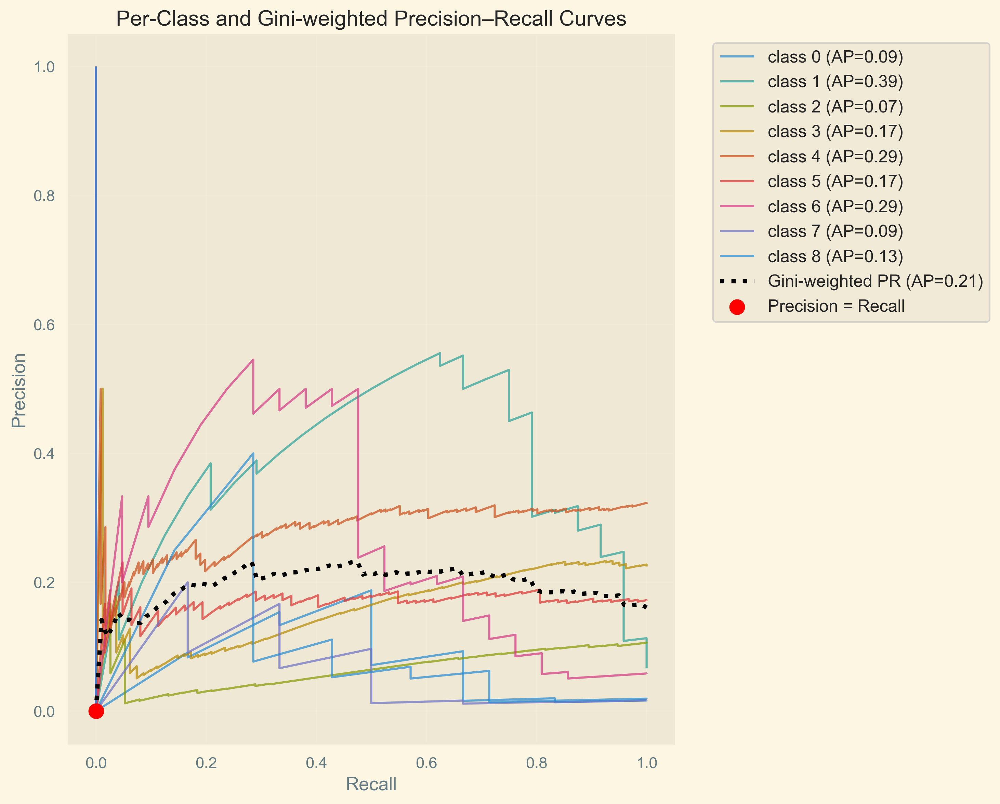

In [48]:
metrics_dict_pr = gini_weighted_pr_curves(y_test, whitened_probabilities_lr, gini_weights_test_lr, n_points=100)

In [49]:
perturbation_results, grouped_rgr_values, summary_df = analyze_multiclass_perturbation(X_test, y_test, lr_best, X_test.columns, 
                                   whitened_probabilities_lr, gini_weights_test_lr, perturbation_percentage=0.05)
summary_df

c:\Users\rosic\anaconda3\envs\rosita\Lib\site-packages\safeaipackage\core.py:61: RuntimeWarning:

invalid value encountered in scalar divide

c:\Users\rosic\anaconda3\envs\rosita\Lib\site-packages\safeaipackage\core.py:61: RuntimeWarning:

invalid value encountered in scalar divide

c:\Users\rosic\anaconda3\envs\rosita\Lib\site-packages\safeaipackage\core.py:61: RuntimeWarning:

invalid value encountered in scalar divide

c:\Users\rosic\anaconda3\envs\rosita\Lib\site-packages\safeaipackage\core.py:61: RuntimeWarning:

invalid value encountered in scalar divide

c:\Users\rosic\anaconda3\envs\rosita\Lib\site-packages\safeaipackage\core.py:61: RuntimeWarning:

invalid value encountered in scalar divide

c:\Users\rosic\anaconda3\envs\rosita\Lib\site-packages\safeaipackage\core.py:61: RuntimeWarning:

invalid value encountered in scalar divide

c:\Users\rosic\anaconda3\envs\rosita\Lib\site-packages\safeaipackage\core.py:61: RuntimeWarning:

invalid value encountered in scalar divide

c:\Use

,Variable,Max RGR,Threshold
0,final_normalized_score_env,0.511558,0.558692
1,final_normalized_score_social,0.510861,0.558692
2,final_normalized_score_governance,0.511760,0.558692
3,MORE_score_2021,0.511907,0.558692
4,MORE_score_2020,0.511558,0.558692
5,total_assets_2022,0.511558,0.558692
6,total_assets_2021,0.512255,0.558692
7,total_assets_2020,0.511558,0.558692
8,current_assets_2022,0.512053,0.558692
9,current_assets_2021,0.513797,0.558692


In [50]:
fig_lr = plot_perturbed_roc_comparison(whitened_probabilities_lr, y_test, gini_weights_test_lr, perturbation_results, grouped_rgr_values, summary_df)
fig_lr.show()


In [51]:
plotly.offline.plot(fig_lr, filename='C:/Users/rosic/Desktop/CreditESGproject/perturbation_lr.html')

'C:/Users/rosic/Desktop/CreditESGproject/perturbation_lr.html'

### Random Forest

In [21]:
from sklearn.ensemble import RandomForestClassifier
rf = RandomForestClassifier(    
    max_leaf_nodes=100,           
    max_features='sqrt',          
    class_weight='balanced', 
    random_state=19              
)
rf_configs = [{
    'clf__n_estimators': [100, 200],
    'clf__max_depth': [6, 8, 10, 12, None],
    'clf__min_samples_split': [5, 10, 15, 20],
    'clf__min_samples_leaf': [2, 4, 6, 8],
    'clf__max_features': [0.5, 0.6, 0.7],
    'clf__bootstrap': [True],
    'clf__oob_score': [True, False], 
    'clf__ccp_alpha': [0.0, 0.01, 0.02, 0.05]
}]

In [22]:
rf_best, rf_scores, rf_class_m = performance_metrics(dt, label='Random Forest', clf=rf, X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test, grid_params=rf_configs)

Number of possible configurations for classifier : 3
-------------------------------------------------- 



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 out of   2 | elapsed:  1.4min finished


-------------------------------------------------- 

Inner Loop

Best F1 Score (on inner  test folds) 0.65
Best parameters: Pipeline(steps=[('dim_reduction',
                 SequentialFeatureSelector(cv=KFold(n_splits=2, random_state=19, shuffle=True),
                                           direction='backward',
                                           estimator=DecisionTreeClassifier(class_weight='balanced',
                                                                            random_state=19),
                                           n_jobs=-1, scoring='f1_weighted')),
                ('clf',
                 RandomForestClassifier(ccp_alpha=0.01, class_weight='balanced',
                                        max_depth=8, max_features=0.7,
                                        max_leaf_nodes=100, min_samples_leaf=2,
                                        min_samples_split=10,
                                        random_state=19))])
F1 Score (on outer test fold)

In [24]:
rf_best

Pipeline(steps=[('dim_reduction', None),
                ('clf',
                 RandomForestClassifier(class_weight='balanced', max_depth=8,
                                        max_features=0.6, max_leaf_nodes=100,
                                        min_samples_leaf=2,
                                        min_samples_split=15, n_estimators=200,
                                        oob_score=True, random_state=19))])

In [23]:
rf_scores

,train_score,test_score,average_performance,fitting_time,Accuracy,Precision,Recall,F1-Score
Random Forest,0.695309,0.622363,0.606 +/- 0.017,61.394747,0.49707,0.56453,0.529086,0.535675


In [56]:
result = pd.concat([result, rf_scores], ignore_index=False)

In [57]:
# Predicted scores
rf_best.fit(X_train, y_train)
test_preds_rf = rf_best.predict(X_test)

In [58]:
rga_rf = core.rga(y_test, test_preds_rf)
rga_results.append(rga_rf)

In [27]:
proba_test_rf = rf_best.predict_proba(X_test)

In [29]:
preds_rf = rf_best.predict(X_test)

In [ ]:
def p_scores_imbalanced(label, y_true, y_pred):
    """
    Calculate performance metrics for imbalanced multiclass classification.
    
    Parameters:
    -----------
    label_name : str
        Name to identify this evaluation
    y_true : array-like
        True class labels
    y_pred : array-like
        Predicted class labels
        
    Returns:
    --------
    tuple: (overall_metrics, class_metrics)
        Two DataFrames containing overall metrics and per-class metrics
    """
    # Overall metrics (weighted, macro, micro)
    metrics = {
        'Balanced_Accuracy': balanced_accuracy_score(y_true, y_pred),
        'Precision_weighted': precision_score(
            y_true, y_pred,
            average='weighted',
            zero_division=1
        ),
        'Recall_weighted': recall_score(
            y_true, y_pred,
            average='weighted',
            zero_division=1
        ),
        'F1-Score_weighted': f1_score(
            y_true, y_pred,
            average='weighted',
            zero_division=1
        ),
        'Precision_macro': precision_score(
            y_true, y_pred,
            average='macro',
            zero_division=1
        ),
        'Recall_macro': recall_score(
            y_true, y_pred,
            average='macro',
            zero_division=1
        ),
        'F1-Score_macro': f1_score(
            y_true, y_pred,
            average='macro',
            zero_division=1
        ),
        'Precision_micro': precision_score(
            y_true, y_pred,
            average='micro',
            zero_division=1
        ),
        'Recall_micro': recall_score(
            y_true, y_pred,
            average='micro',
            zero_division=1
        ),
        'F1-Score_micro': f1_score(
            y_true, y_pred,
            average='micro',
            zero_division=1
        )
    }
    df_metrics = pd.DataFrame(metrics, index=[label])
    
    # Per‑class metrics
    precision_vals = precision_score(
        y_true, y_pred,
        average=None,
        zero_division=1
    )
    recall_vals = recall_score(
        y_true, y_pred,
        average=None,
        zero_division=1
    )
    f1_vals = f1_score(
        y_true, y_pred, 
        average=None,
        zero_division=1
    )
    
    # Create a structured DataFrame for per-class metrics
    class_metrics_data = []
    for i in range(len(precision_vals)):
        class_metrics_data.append({
            'Class': i,
            'Precision': precision_vals[i],
            'Recall': recall_vals[i],
            'F1-Score': f1_vals[i]
        })
    
    df_class = pd.DataFrame(class_metrics_data)
    
    # Optional: Add class distribution information
    unique, counts = np.unique(y_true, return_counts=True)
    distribution = dict(zip(unique, counts))
    df_class['Samples'] = df_class['Class'].map(lambda x: distribution.get(x, 0))
    df_class['Distribution (%)'] = df_class['Samples'] / len(y_true) * 100

    return df_metrics, df_class

In [30]:
overall_metrics, class_metrics = p_scores_imbalanced('idk', y_test, preds_rf)

In [31]:
overall_metrics

,Balanced_Accuracy,Precision_weighted,Recall_weighted,F1-Score_weighted,Precision_macro,Recall_macro,F1-Score_macro,Precision_micro,Recall_micro,F1-Score_micro
idk,0.49707,0.56453,0.529086,0.535675,0.496042,0.49707,0.474255,0.529086,0.529086,0.529086


Unidimensional Gini for class 0: 0.0186
Unidimensional Gini for class 1: 0.0186
Unidimensional Gini for class 2: 0.0188
Unidimensional Gini for class 3: 0.0187
Unidimensional Gini for class 4: 0.0186
Unidimensional Gini for class 5: 0.0186
Unidimensional Gini for class 6: 0.0186
Unidimensional Gini for class 7: 0.0186
Unidimensional Gini for class 8: 0.0198
Unidimensional Gini for class 0: 0.0188
Unidimensional Gini for class 1: 0.0187
Unidimensional Gini for class 2: 0.0187
Unidimensional Gini for class 3: 0.0187
Unidimensional Gini for class 4: 0.0185
Unidimensional Gini for class 5: 0.0185
Unidimensional Gini for class 6: 0.0193
Unidimensional Gini for class 7: 0.0186
Unidimensional Gini for class 8: 0.0197
Multidimensional Theoretical Gini Test set 0.01866706683882871
Multidimensional Theoretical Gini Train set 0.018714644739198077
Multiclass Theoretical AUC Test set 0.5093335334194143
Multiclass Theoretical AUC Train set 0.5093573223695991
Unidimensional Gini for class 0: 0.0186
U

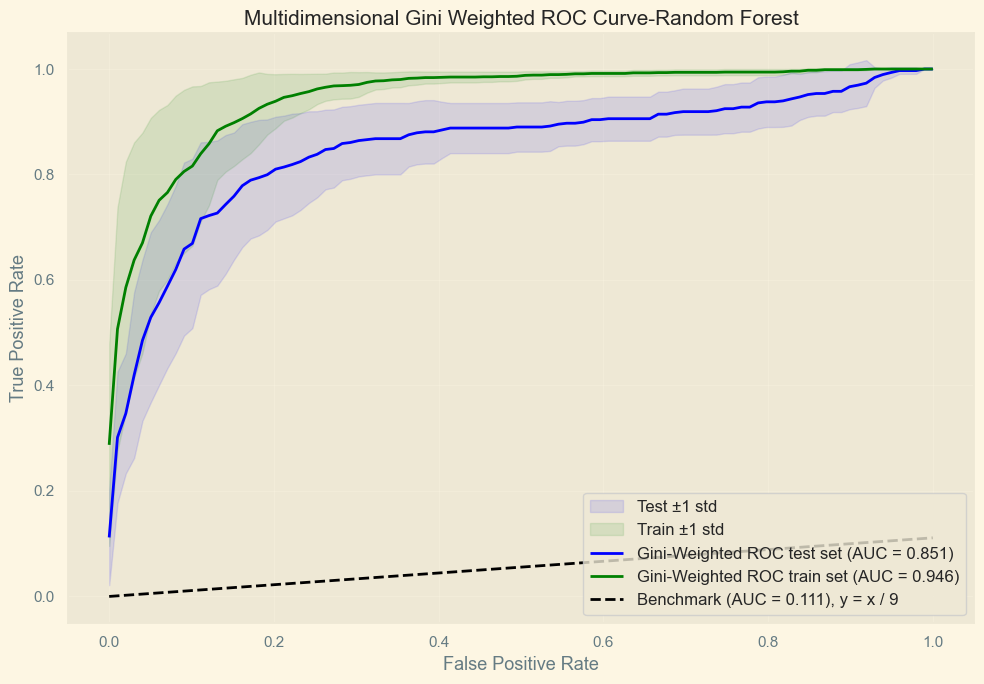


Key Results:
├─ Theoretical Gini (test): 0.0187
├─ Theoretical AUC (test): 0.5093
├─ Empirical AUC (test): 0.8509

Class Weights (Gini-based):
  Class 0: 0.0124
  Class 1: 0.1111
  Class 2: 0.1358
  Class 3: 0.1604
  Class 4: 0.2098
  Class 5: 0.1852
  Class 6: 0.0864
  Class 7: 0.0615
  Class 8: 0.0373

Comparison with Standard Metrics:
├─ Standard Macro AUC: 0.9028
├─ Standard Micro AUC: 0.9180
└─ Gini-weighted AUC: 0.8509

Displaying interactive ROC curve...



Best F1 Score 0.3034 is achieved at threshold 0.5455

ANALYSIS COMPLETE


In [60]:
results_rf = complete_roc_analysis(
    y_train=y_train,
    y_test=y_test,
    X_test=X_test,
    X_train= X_train,
    model=rf_best,
    classifier_name="Random Forest",
    key_results_display=True
)

In [61]:
import plotly
import plotly.express as px
plotly.offline.plot(results_rf['figures']['interactive_roc'], filename='C:/Users/rosic/Desktop/CreditESGproject/multiroc_rf.html')
plotly.offline.plot(results_rf['figures']['marginal_roc'], filename='C:/Users/rosic/Desktop/CreditESGproject/multimarginal_rf.html')

'C:/Users/rosic/Desktop/CreditESGproject/multimarginal_rf.html'

In [62]:
whitened_probabilities_rf, _ = whitening_predicted_proba_stable(X_test, X_train, rf_best, y_test, multilabel=False)

In [63]:
gini_weights_test_rf  = results_rf['weights_test']

C:\Users\rosic\AppData\Local\Temp\ipykernel_23576\2098506431.py:8: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




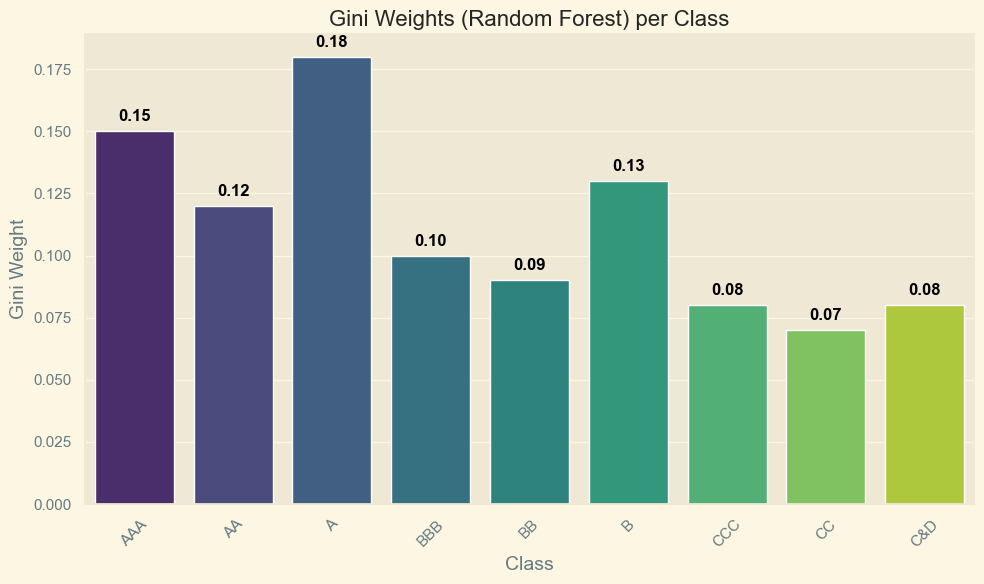

In [109]:
import matplotlib.pyplot as plt
import seaborn as sns

classes = ['AAA', 'AA', 'A', 'BBB', 'BB', 'B', 'CCC', 'CC', 'C&D']
gini_weights_test_rf = [0.15, 0.12, 0.18, 0.10, 0.09, 0.13, 0.08, 0.07, 0.08]  # Replace with your actual values

plt.figure(figsize=(10, 6))
ax = sns.barplot(x=classes, y=gini_weights_test_rf, palette='viridis')
plt.title('Gini Weights (Random Forest) per Class', fontsize=16)
plt.xlabel('Class', fontsize=14)
plt.ylabel('Gini Weight', fontsize=14)
plt.xticks(rotation=45)
plt.tight_layout()

# Add weights on top of each bar
for i, v in enumerate(gini_weights_test_rf):
    ax.text(i, v + 0.004, f"{v:.2f}", color='black', ha='center', fontweight='bold')

plt.show()

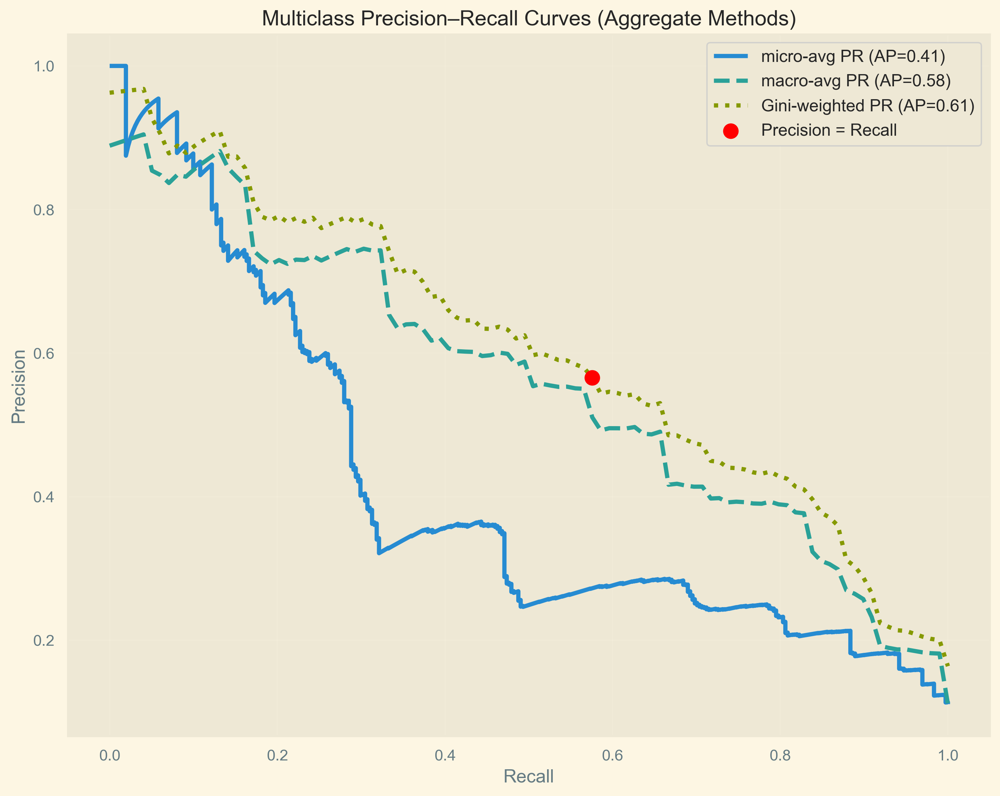

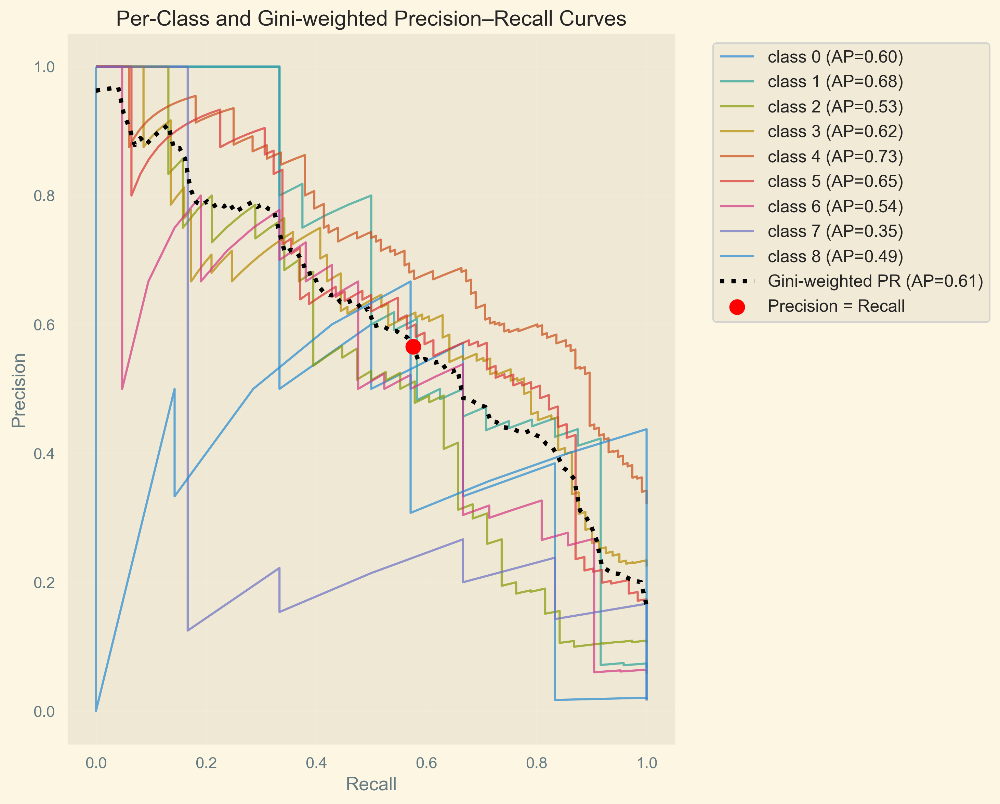

In [65]:
metrics_dict_pr = gini_weighted_pr_curves(y_test, whitened_probabilities_rf, gini_weights_test_rf, n_points=100)

In [66]:
# Max F1 Score at a certain threshold
max_f1 = []
for key, value in metrics_dict_pr.items():
    for metric, score in value.items():
        if metric == 'f1_score':
            max_f1.append((float(key), score))  # Use 'score' instead of 'value'
        
max_f1 = sorted(max_f1, key=lambda x: x[1], reverse=True)

print(f"\nBest F1 Score {max_f1[0][1]:.4f} is achieved at threshold {max_f1[0][0]:.4f}")


Best F1 Score 0.5867 is achieved at threshold 0.6570


In [67]:
# Create renamed columns for privacy (only for plots)
X_test_columns_renamed = [
    'credit_rating_2021' if col == 'MORE_score_2021' 
    else 'credit_rating_2020' if col == 'MORE_score_2020' 
    else col 
    for col in X_test.columns
]

print("Original column names that will be renamed:")
for i, col in enumerate(X_test.columns):
    if col in ['MORE_score_2021', 'MORE_score_2020']:
        print(f"{col} -> {X_test_columns_renamed[i]}")
        
print(f"\nTotal columns: {len(X_test_columns_renamed)}")

Original column names that will be renamed:
MORE_score_2021 -> credit_rating_2021
MORE_score_2020 -> credit_rating_2020

Total columns: 37


In [68]:
perturbation_results, grouped_rgr_values, summary_df = analyze_multiclass_perturbation(X_test, y_test, rf_best, X_test.columns, 
                                   whitened_probabilities_rf, gini_weights_test_rf, perturbation_percentage=0.05)
summary_df

,Variable,Max RGR,Threshold
0,final_normalized_score_env,0.546869,0.611845
1,final_normalized_score_social,0.546760,0.608805
2,final_normalized_score_governance,0.546760,0.608805
3,MORE_score_2021,0.549035,0.608805
4,MORE_score_2020,0.548894,0.608805
5,total_assets_2022,0.546760,0.608805
6,total_assets_2021,0.546760,0.608805
7,total_assets_2020,0.546760,0.608805
8,current_assets_2022,0.546366,0.608805
9,current_assets_2021,0.546507,0.608805


In [69]:
fig_rf = plot_perturbed_roc_comparison(whitened_probabilities_rf, y_test, gini_weights_test_rf, perturbation_results, grouped_rgr_values, summary_df)
fig_rf.show()

In [70]:
plotly.offline.plot(fig_rf, filename='C:/Users/rosic/Desktop/CreditESGproject/perturbation_rf.html')

'C:/Users/rosic/Desktop/CreditESGproject/perturbation_rf.html'

### Bagging classifier

In [71]:
from sklearn.ensemble import BaggingClassifier
bag_clf = BaggingClassifier(n_jobs=12, random_state=19, bootstrap=True)

bag_clf_configs = [{
    'clf__estimator': [lr],
    'clf__n_estimators': [50, 100, 200],
    'clf__estimator__C': [0.1, 1.0, 10.0],
    'clf__estimator__penalty': ['l2'],
    'clf__max_samples': [0.3, 0.5, 0.7],
    'clf__bootstrap_features': [False, True]
}]


In [72]:
bag_best, bag_scores, bag_class_m = performance_metrics(dt, label='Bagging Classifier', clf=bag_clf, X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test, grid_params=bag_clf_configs)

Number of possible configurations for classifier : 3
-------------------------------------------------- 



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 out of   2 | elapsed:  5.7min finished


-------------------------------------------------- 

Inner Loop

Best F1 Score (on inner  test folds) 0.51
Best parameters: Pipeline(steps=[('dim_reduction',
                 SequentialFeatureSelector(cv=KFold(n_splits=2, random_state=19, shuffle=True),
                                           estimator=DecisionTreeClassifier(class_weight='balanced',
                                                                            random_state=19),
                                           n_jobs=-1, scoring='f1_weighted')),
                ('clf',
                 BaggingClassifier(bootstrap_features=True,
                                   estimator=LogisticRegression(C=10.0,
                                                                class_weight='balanced',
                                                                max_iter=1000,
                                                                random_state=19,
                                                                sol

c:\Users\rosic\anaconda3\envs\rosita\Lib\site-packages\sklearn\model_selection\_validation.py:528: FitFailedWarning:


2 fits failed out of a total of 22.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
2 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\rosic\anaconda3\envs\rosita\Lib\site-packages\sklearn\model_selection\_validation.py", line 866, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\rosic\anaconda3\envs\rosita\Lib\site-packages\sklearn\base.py", line 1389, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\rosic\anaconda3\envs\rosita\Lib\site-packages\imblearn\pipeline.py"

In [73]:
bag_best

Pipeline(steps=[('dim_reduction',
                 SequentialFeatureSelector(cv=KFold(n_splits=2, random_state=19, shuffle=True),
                                           estimator=DecisionTreeClassifier(class_weight='balanced',
                                                                            random_state=19),
                                           n_jobs=-1, scoring='f1_weighted')),
                ('clf',
                 BaggingClassifier(bootstrap_features=True,
                                   estimator=LogisticRegression(C=10.0,
                                                                class_weight='balanced',
                                                                max_iter=1000,
                                                                random_state=19,
                                                                solver='saga'),
                                   max_samples=0.5, n_estimators=200, n_jobs=12,
                                   random_state=19))])

In [74]:
bag_scores

,train_score,test_score,average_performance,fitting_time,Accuracy,Precision,Recall,F1-Score
Bagging Classifier,0.524221,0.484398,0.469 +/- 0.016,343.996816,0.400181,0.51706,0.443213,0.463661


In [75]:
result = pd.concat([result, bag_scores], ignore_index=False)

In [76]:
# Predicted scores
bag_best.fit(X_train, y_train)
test_preds_bag = bag_best.predict(X_test)

In [77]:
rga_bag = core.rga(y_test, test_preds_bag)
rga_results.append(rga_bag)

In [78]:
result

,train_score,test_score,average_performance,fitting_time,Accuracy,Precision,Recall,F1-Score
Decision Tree,0.553095,0.553084,0.527 +/- 0.026,55.848569,0.483538,0.541102,0.515235,0.514154
Logistic Regression,0.603431,0.514259,0.495 +/- 0.019,78.608192,0.354835,0.532308,0.531856,0.514165
Random Forest,0.695309,0.622363,0.606 +/- 0.017,54.122740,0.497070,0.564530,0.529086,0.535675
Bagging Classifier,0.524221,0.484398,0.469 +/- 0.016,343.996816,0.400181,0.517060,0.443213,0.463661


In [79]:
rga_results

[np.float64(0.8739265578911997),
 np.float64(0.8680226262927977),
 np.float64(0.8860751222790576),
 np.float64(0.8670565283948773)]

In [80]:
proba_test_bag = bag_best.predict_proba(X_test)

Unidimensional Gini for class 0: 0.0188
Unidimensional Gini for class 1: 0.1300
Unidimensional Gini for class 2: 0.1300
Unidimensional Gini for class 3: 0.1300
Unidimensional Gini for class 4: 0.1300
Unidimensional Gini for class 5: 0.1300
Unidimensional Gini for class 6: 0.1300
Unidimensional Gini for class 7: 0.1300
Unidimensional Gini for class 8: 0.0186
Unidimensional Gini for class 0: 0.0186
Unidimensional Gini for class 1: 0.1297
Unidimensional Gini for class 2: 0.1297
Unidimensional Gini for class 3: 0.1297
Unidimensional Gini for class 4: 0.1297
Unidimensional Gini for class 5: 0.1297
Unidimensional Gini for class 6: 0.1297
Unidimensional Gini for class 7: 0.1297
Unidimensional Gini for class 8: 0.0186
Multidimensional Theoretical Gini Test set 0.12449069761461344
Multidimensional Theoretical Gini Train set 0.12422943187144198
Multiclass Theoretical AUC Test set 0.5622453488073067
Multiclass Theoretical AUC Train set 0.5621147159357209
Unidimensional Gini for class 0: 0.0188
Un

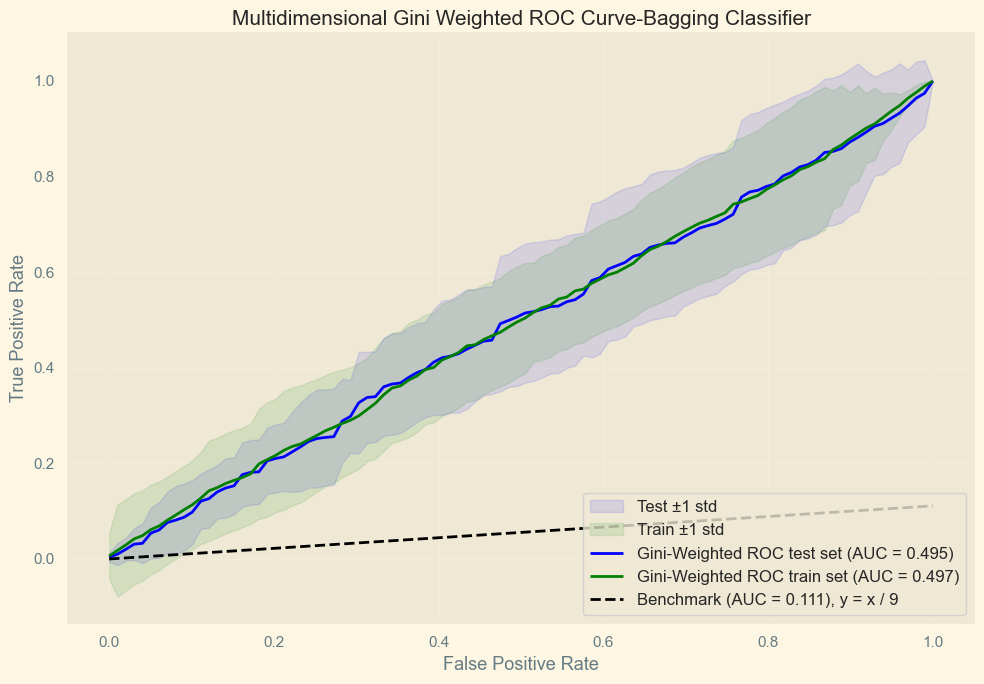


Key Results:
├─ Theoretical Gini (test): 0.1245
├─ Theoretical AUC (test): 0.5622
├─ Empirical AUC (test): 0.4946

Class Weights (Gini-based):
  Class 0: 0.0370
  Class 1: 0.1358
  Class 2: 0.1358
  Class 3: 0.1358
  Class 4: 0.1358
  Class 5: 0.1358
  Class 6: 0.1358
  Class 7: 0.1358
  Class 8: 0.0124

Comparison with Standard Metrics:
├─ Standard Macro AUC: 0.8402
├─ Standard Micro AUC: 0.8592
└─ Gini-weighted AUC: 0.4946

Displaying interactive ROC curve...



Best F1 Score 0.2214 is achieved at threshold 0.1111

ANALYSIS COMPLETE


In [81]:
results_bag = complete_roc_analysis(
    y_train=y_train,
    y_test=y_test,
    X_test=X_test,
    X_train= X_train,
    model=bag_best,
    classifier_name="Bagging Classifier",
    key_results_display=True
)

In [82]:
plotly.offline.plot(results_bag['figures']['interactive_roc'], filename='C:/Users/rosic/Desktop/CreditESGproject/multiroc_bag.html')
plotly.offline.plot(results_bag['figures']['marginal_roc'], filename='C:/Users/rosic/Desktop/CreditESGproject/multimarginal_bag.html')

'C:/Users/rosic/Desktop/CreditESGproject/multimarginal_bag.html'

In [83]:
whitened_probabilities_bag, _ = whitening_predicted_proba_stable(X_test, X_train, bag_best,y_test, multilabel=False)

In [84]:
gini_weights_test_bag  = results_bag['weights_test']

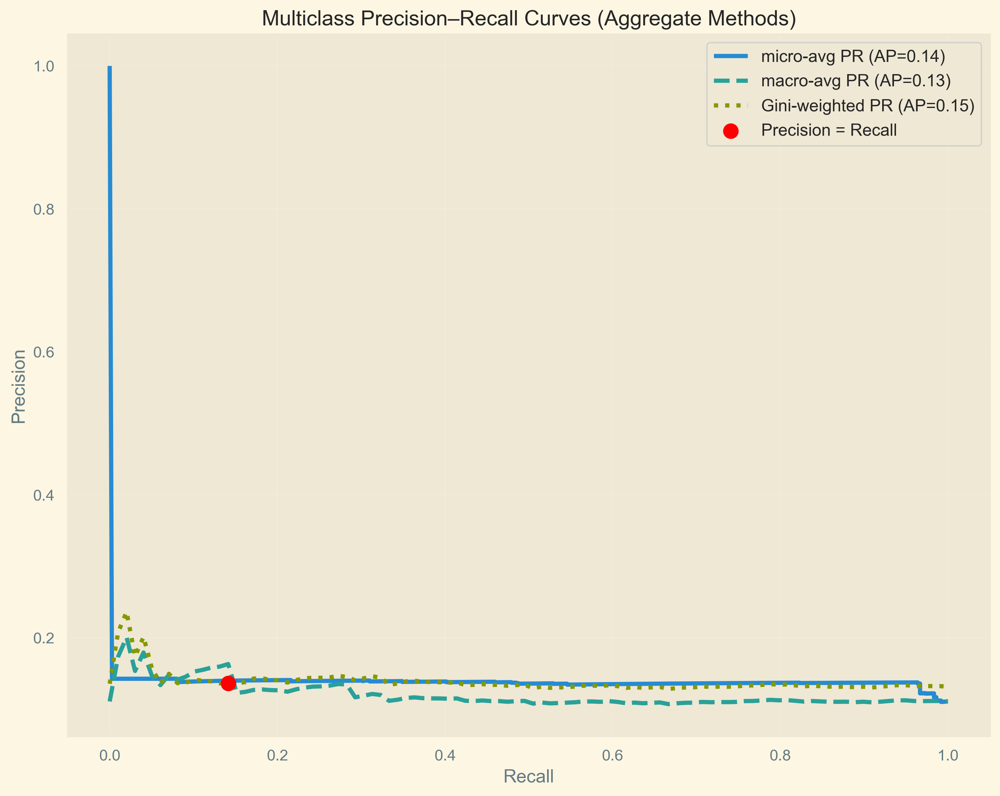

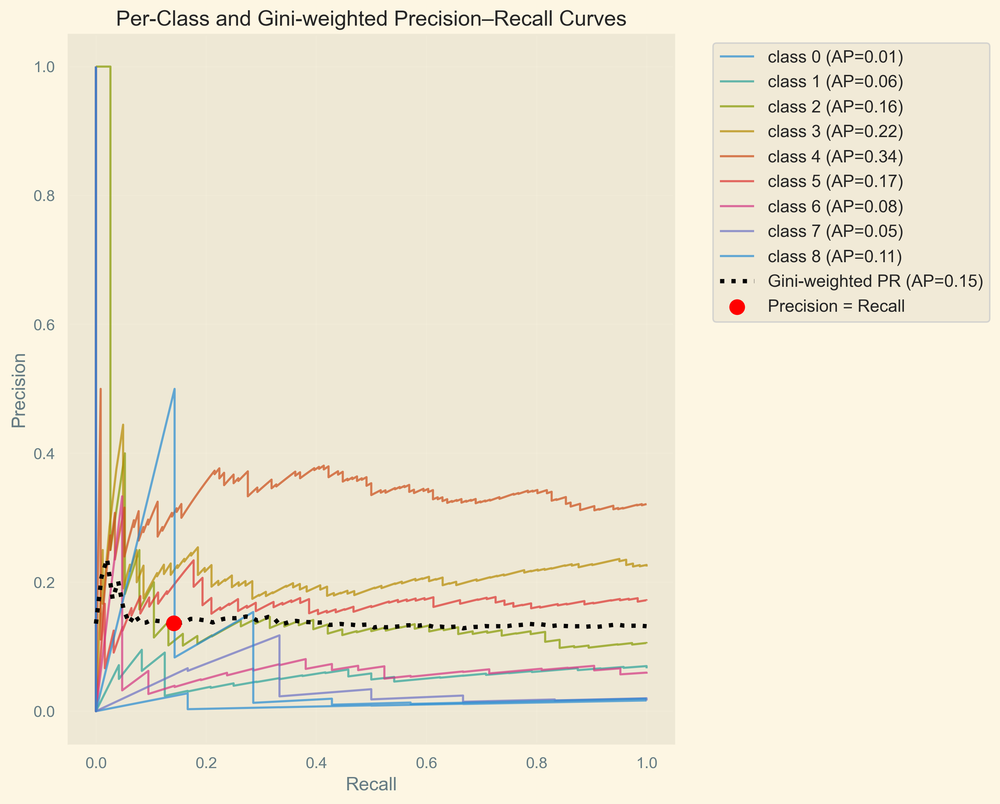

In [85]:
metrics_dict_pr = gini_weighted_pr_curves(y_test, whitened_probabilities_bag, gini_weights_test_bag, n_points=100)

In [86]:
# Max F1 Score at a certain threshold
max_f1 = []
for key, value in metrics_dict_pr.items():
    for metric, score in value.items():
        if metric == 'f1_score':
            max_f1.append((float(key), score))  # Use 'score' instead of 'value'
        
max_f1 = sorted(max_f1, key=lambda x: x[1], reverse=True)

print(f"\nBest F1 Score {max_f1[0][1]:.4f} is achieved at threshold {max_f1[0][0]:.4f}")


Best F1 Score 0.2347 is achieved at threshold 0.9490


In [87]:
perturbation_results, grouped_rgr_values, summary_df = analyze_multiclass_perturbation(X_test, y_test, bag_best, X_test.columns, 
                                   whitened_probabilities_bag, gini_weights_test_bag, perturbation_percentage=0.05)
summary_df

c:\Users\rosic\anaconda3\envs\rosita\Lib\site-packages\safeaipackage\core.py:61: RuntimeWarning:

invalid value encountered in scalar divide

c:\Users\rosic\anaconda3\envs\rosita\Lib\site-packages\safeaipackage\core.py:61: RuntimeWarning:

invalid value encountered in scalar divide

c:\Users\rosic\anaconda3\envs\rosita\Lib\site-packages\safeaipackage\core.py:61: RuntimeWarning:

invalid value encountered in scalar divide

c:\Users\rosic\anaconda3\envs\rosita\Lib\site-packages\safeaipackage\core.py:61: RuntimeWarning:

invalid value encountered in scalar divide

c:\Users\rosic\anaconda3\envs\rosita\Lib\site-packages\safeaipackage\core.py:61: RuntimeWarning:

invalid value encountered in scalar divide

c:\Users\rosic\anaconda3\envs\rosita\Lib\site-packages\safeaipackage\core.py:61: RuntimeWarning:

invalid value encountered in scalar divide

c:\Users\rosic\anaconda3\envs\rosita\Lib\site-packages\safeaipackage\core.py:61: RuntimeWarning:

invalid value encountered in scalar divide

c:\Use

,Variable,Max RGR,Threshold
0,final_normalized_score_env,0.577325,0.21331
1,final_normalized_score_social,0.577325,0.21331
2,final_normalized_score_governance,0.577325,0.21331
3,MORE_score_2021,0.576677,0.21331
4,MORE_score_2020,0.577325,0.21331
5,total_assets_2022,0.577325,0.21331
6,total_assets_2021,0.577325,0.21331
7,total_assets_2020,0.577325,0.21331
8,current_assets_2022,0.577325,0.21331
9,current_assets_2021,0.577325,0.21331


In [88]:
fig_bag = plot_perturbed_roc_comparison(whitened_probabilities_bag, y_test, gini_weights_test_bag, perturbation_results, grouped_rgr_values, summary_df)
fig.show()

C:\Users\rosic\AppData\Local\Temp\ipykernel_23576\568369664.py:2: UserWarning:

FigureCanvasAgg is non-interactive, and thus cannot be shown



In [89]:
plotly.offline.plot(fig_bag, filename='C:/Users/rosic/Desktop/CreditESGproject/perturbation_bag.html')

'C:/Users/rosic/Desktop/CreditESGproject/perturbation_bag.html'

In [90]:
# Best model optimization

In [91]:
# from sklearn.ensemble import RandomForestClassifier
# rf = RandomForestClassifier(    
#     max_leaf_nodes=100,           
#     max_features='sqrt',          
#     class_weight='balanced',
#     random_state=19               
# )
# rf_configs = [{
#     'clf__n_estimators': [100, 200],
#     'clf__max_depth': [None, 4, 6, 8],
#     'clf__min_samples_split': [None,5, 10, 15],
#     'clf__min_samples_leaf': [None, 2, 3],
#     'clf__max_features': [0.5, 0.6, 0.7],
#     'clf__bootstrap': [True],
#     'clf__oob_score': [True, False], 
#     'clf__ccp_alpha': [0.0, 0.01]
# }]

In [92]:
# rf_opti, rf_scores_opti, rf_class_opti = performance_metrics(dt, label='Random Forest', clf=rf, X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test, grid_params=rf_configs)

In [93]:
# rf_opti

In [94]:
# rf_scores_opti

In [95]:
# rf_class_opti

In [96]:
# # Predicted scores
# whitened_test_preds_best = rf_opti.predict(X_test)
# whitened_train_preds_best = rf_opti.predict(X_train)

In [97]:
# whitened_test_preds_best_list = list(whitened_test_preds_best.flatten())
# y_test_list = list(y_test.values.flatten())

# rga_results = []
# rga_dt = core.rga(y_test, whitened_test_preds_best)

## Model explainability

In [98]:
# Create renamed columns using list comprehension
X_test_columns_renamed = [
    'credit_rating_2021' if col == 'MORE_score_2021' 
    else 'credit_rating_2020' if col == 'MORE_score_2020' 
    else col 
    for col in X_test.columns
]

In [99]:
feature_names = X_test_columns_renamed

importance = rf_best.named_steps['clf'].feature_importances_

top_feature_indices = importance.argsort()[-4:][::-1]
print("Top 18 features:")
for i, index in enumerate(top_feature_indices):
    print(f"    Feature: {feature_names[index]}, Importance: {importance[index]}, Index: {index}")

Top 18 features:
    Feature: credit_rating_2021, Importance: 0.4242351896516383, Index: 3
    Feature: credit_rating_2020, Importance: 0.06951426164046941, Index: 4
    Feature: net_income_2022, Importance: 0.0691405232323488, Index: 22
    Feature: EBIT_2022, Importance: 0.06186523420988015, Index: 19


In [100]:
from sklearn.inspection import permutation_importance

per_feats = permutation_importance(rf_best, X_test, y_test,
                           n_repeats=3,
                           random_state=19)

print("Top features:")
for i in per_feats.importances_mean.argsort()[::-1]:
    if per_feats.importances_mean[i] - 2 * per_feats.importances_std[i] > 0:
        print(f"     {X_test_columns_renamed[i]:<8} "
              f"{per_feats.importances_mean[i]:.3f}"
              f" +/- {per_feats.importances_std[i]:.3f}")

Top features:
     credit_rating_2021 0.345 +/- 0.009
     net_income_2022 0.031 +/- 0.001
     credit_rating_2020 0.009 +/- 0.003


C:\Users\rosic\AppData\Local\Temp\ipykernel_23576\1827112108.py:10: MatplotlibDeprecationWarning:

The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.



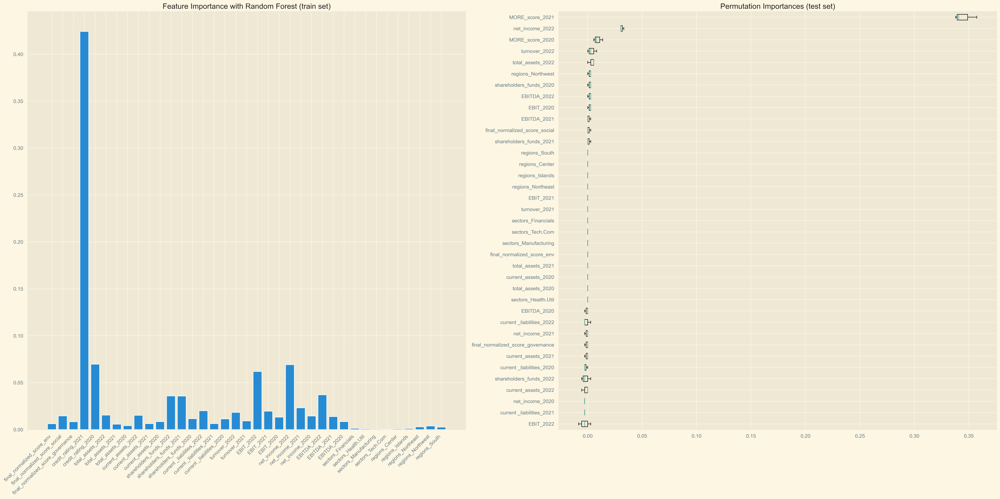

In [101]:
sorted_idx = per_feats.importances_mean.argsort()

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(30, 15), dpi=300)

ax1.bar([x for x in range(len(importance))], importance);
ax1.set_xticks(ticks=[i for i in range(len(feature_names))]);
ax1.set_xticklabels(feature_names, rotation=45, ha='right');
ax1.set_title('Feature Importance with Random Forest (train set)')

ax2.boxplot(per_feats.importances[sorted_idx].T, vert=False, labels=X_test.columns[sorted_idx])
ax2.set_title('Permutation Importances (test set)')

fig.tight_layout();

In [102]:
# SIMPLE WORKING SHAP SOLUTION - No more debugging needed!
print("=== SIMPLE SHAP ANALYSIS ===")

import shap
import numpy as np

# Step 1: Get the classifier directly (bypass the pipeline complexity)
rf_classifier = rf_best.named_steps['clf']
print(f"Classifier type: {type(rf_classifier)}")
print(f"Expected features: {rf_classifier.n_features_in_}")

# Step 2: Use the original test data (as numpy array)
X_for_shap = X_test.values
print(f"Data shape: {X_for_shap.shape}")

# Step 3: Create explainer and calculate SHAP values
explainer = shap.TreeExplainer(rf_classifier)
shap_values = explainer.shap_values(X_for_shap[:50])  # Use fewer samples for speed

print(f"✅ SUCCESS! SHAP values shape: {len(shap_values)} classes × {shap_values[0].shape}")

# Step 4: Simple feature importance plot
feature_importance = np.abs(shap_values[0]).mean(0)
for i in range(1, len(shap_values)):
    feature_importance += np.abs(shap_values[i]).mean(0)

# Get top 15 features
top_indices = feature_importance.argsort()[-15:][::-1]
top_features = [X_test_columns_renamed[i] for i in top_indices]
top_importance = feature_importance[top_indices]

print("\n🏆 TOP 15 MOST IMPORTANT FEATURES:")
for i, (feature, importance) in enumerate(zip(top_features, top_importance)):
    print(f"{i+1:2d}. {feature:<30} {importance:.4f}")

=== SIMPLE SHAP ANALYSIS ===
Classifier type: <class 'sklearn.ensemble._forest.RandomForestClassifier'>
Expected features: 37
Data shape: (361, 37)
✅ SUCCESS! SHAP values shape: 50 classes × (37, 9)

🏆 TOP 15 MOST IMPORTANT FEATURES:
 1. total_assets_2022              0.3133
 2. credit_rating_2020             0.2886
 3. final_normalized_score_social  0.2813
 4. total_assets_2021              0.2630
 5. final_normalized_score_governance 0.2519
 6. credit_rating_2021             0.2476
 7. total_assets_2020              0.2353
 8. final_normalized_score_env     0.2171
 9. current_assets_2022            0.1722


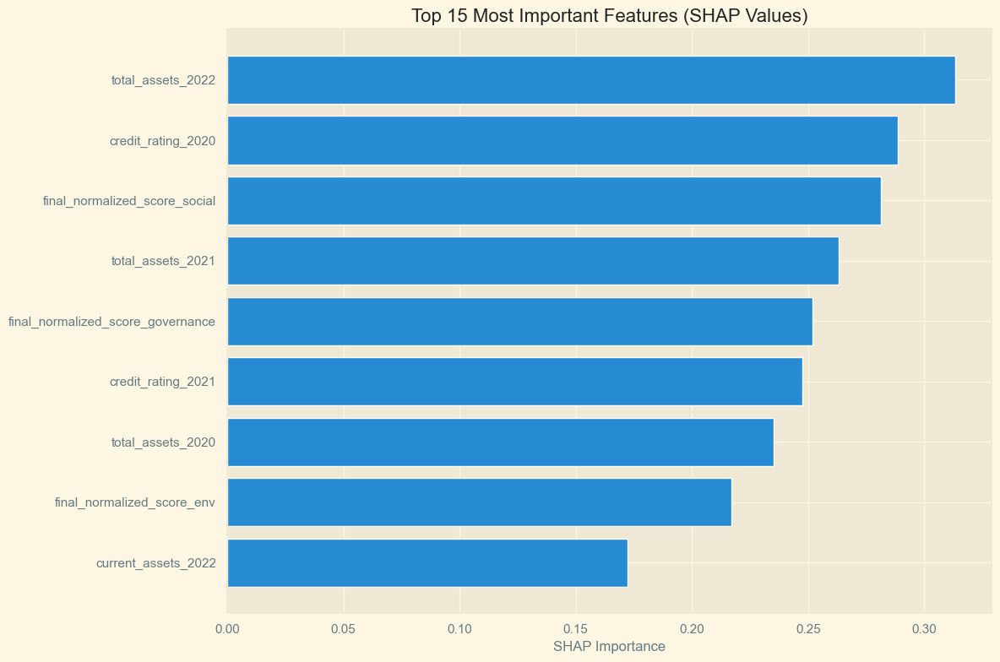

In [103]:
# Simple bar chart of feature importance
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 8))
plt.barh(range(len(top_features)), top_importance)
plt.yticks(range(len(top_features)), top_features)
plt.xlabel('SHAP Importance')
plt.title('Top 15 Most Important Features (SHAP Values)')
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

Number of features available: 9


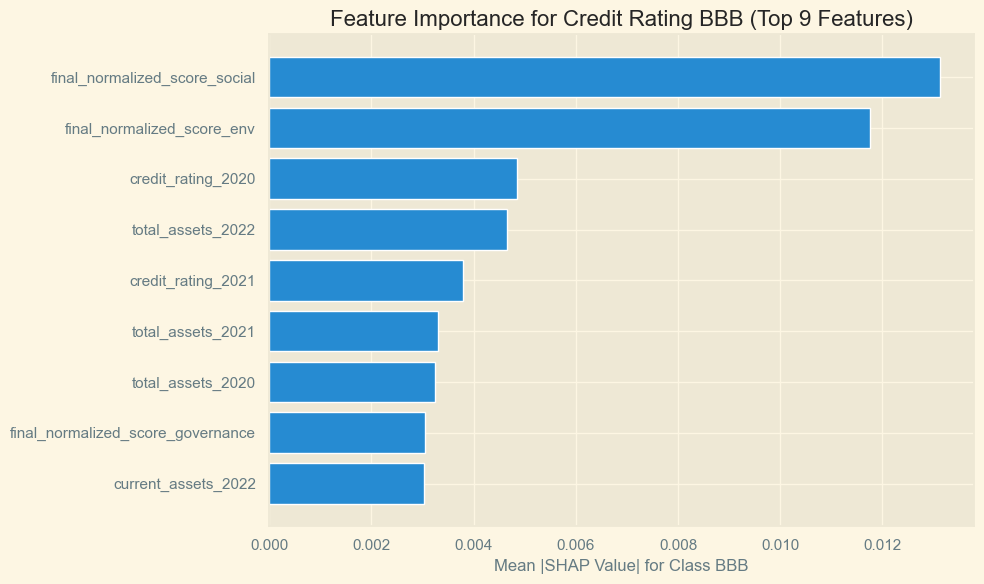

✅ Analysis complete for class BBB!
Plotted 9 most important features


In [104]:
# Fixed SHAP plot for individual class
class_idx = 3  # BBB class
class_name = 'BBB'

plt.figure(figsize=(10, 6))
feature_shap_values = shap_values[class_idx]
mean_abs_shap = np.abs(feature_shap_values).mean(0)

# Get the number of available features (should be 37, not 9)
n_features = len(mean_abs_shap)
print(f"Number of features available: {n_features}")

# Get top features (limit to available features)
n_top = min(15, n_features)
sorted_idx = mean_abs_shap.argsort()[-n_top:][::-1]

plt.barh(range(n_top), mean_abs_shap[sorted_idx])
plt.yticks(range(n_top), [X_test_columns_renamed[i] for i in sorted_idx])
plt.xlabel(f'Mean |SHAP Value| for Class {class_name}')
plt.title(f'Feature Importance for Credit Rating {class_name} (Top {n_top} Features)')
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

print(f"✅ Analysis complete for class {class_name}!")
print(f"Plotted {n_top} most important features")

In [145]:
import numpy as np
from scipy.spatial import distance

def pairwise_mahalanobis(proba, y_true):
    """
    Computes the pairwise Mahalanobis distances between the means
    of each class in the predicted probability (or feature) space.

    Parameters:
    -----------
    proba : array-like, shape (n_samples, n_features)
        Predicted probabilities or feature vectors for each sample.
    y_true : array-like, shape (n_samples,)
        True class labels for each sample.

    Returns:
    --------
    M : ndarray, shape (n_classes, n_classes)
        Matrix of pairwise Mahalanobis distances between class means.
    class_labels : ndarray, shape (n_classes,)
        The order of class labels (to interpret the rows/columns of M).
    """
    # Ensure input is ndarray
    proba = np.asarray(proba)
    y_true = np.asarray(y_true)

    # Identify unique classes and their means
    class_labels = np.unique(y_true)
    means = []
    for cls in class_labels:
        means.append(proba[y_true == cls].mean(axis=0))
    means = np.vstack(means)
    
    # Covariance of the whole data (can also use pooled within-class covariance if needed)
    cov = np.cov(proba, rowvar=False)
    inv_cov = np.linalg.pinv(cov)  # Use pseudo-inverse for stability

    # Compute pairwise Mahalanobis distances between class means
    n_classes = len(class_labels)
    M = np.zeros((n_classes, n_classes))
    for i in range(n_classes):
        for j in range(n_classes):
            if i == j:
                M[i, j] = 0.0
            else:
                diff = means[i] - means[j]
                M[i, j] = np.sqrt(np.dot(np.dot(diff, inv_cov), diff.T))  # Mahalanobis formula

    return M, class_labels


In [151]:
M, labels = pairwise_mahalanobis(proba_test_rf, y_test)


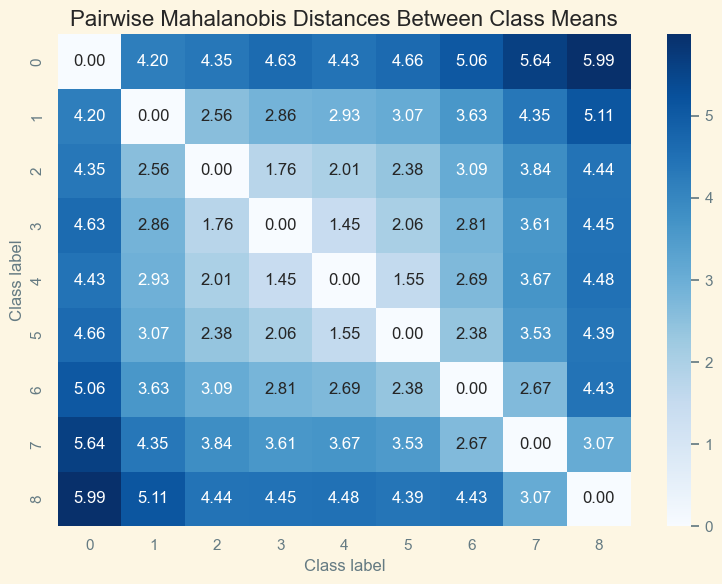

In [147]:
plt.figure(figsize=(8, 6))
sns.heatmap(M, xticklabels=labels, yticklabels=labels, annot=True, cmap="Blues", fmt=".2f", cbar=True)
plt.title("Pairwise Mahalanobis Distances Between Class Means")
plt.xlabel("Class label")
plt.ylabel("Class label")
plt.tight_layout()
plt.show()
